___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

<h1 style="text-align: center;">Deep Learning<br><br>Assignment-1 (ANN)<br><br>Churn Prediction for Bank Customer<br><h1>

# Dataset Info

We have a dataset in which there are details of a bank's customers and the target variable is a binary variable reflecting the fact whether the customer left the bank (closed his account) or he continues to be a customer.

The features in the given dataset are:
- **rownumber:** Row Numbers from 1 to 10000.
- **customerid:** A unique ID that identifies each customer.
- **surname:** The customer’s surname.
- **creditscore:** A credit score is a number between 300–850 that depicts a consumer's creditworthiness.
- **geography:** The country from which the customer belongs to.
- **Gender:** The customer’s gender: Male, Female
- **Age:** The customer’s current age, in years, at the time of being customer.
- **tenure:** The number of years for which the customer has been with the bank.
- **balance:** Bank balance of the customer.
- **numofproducts:** the number of bank products the customer is utilising.
- **hascrcard:** The number of credit cards given to the customer by the bank.
- **isactivemember:** Binary Flag for indicating if the client is active or not with the bank before the moment where the client exits the company (recorded in the variable "exited")
- **exited:** Binary flag 1 if the customer closed account with bank and 0 if the customer is retained.

In [5]:
#!pip install pyforest
#!pip install ipython
#!pip install pyclustertend
#!pip install xlrd
#!pip install Autoviz
#!pip install colorama
#!pip3 install termcolor
#!pip install termcolor
#!pip install pandas-profiling
#!pip install cufflinks

In [6]:
#!pip co

In [7]:
# !pip uninstall numba visions pandas-profiling

In [8]:
# !pip install numba==0.53.1
# !pip install visions==0.7.4
# !pip install pandas-profiling==3.1.0

In [9]:
#!pip uninstall numba visions pandas-profiling pandas

In [10]:
#!pip install pandas-profiling==3.1.0

In [11]:
#!pip install ydata_profiling

In [12]:
#!pip install plotly

# Improt Libraries & Data

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
# %matplotlib notebook
plt.rcParams["figure.figsize"] = (12,6)
# plt.rcParams['figure.dpi'] = 100
sns.set_style("whitegrid")
#pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.options.display.float_format = '{:,.2f}'.format

# Importing plotly and cufflinks in offline mode
import plotly.express as px
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

# Ignore Warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.warn("this will not show")

# Figure & Display options
plt.rcParams["figure.figsize"] = (10, 6)
pd.set_option('max_colwidth',200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 200)
import matplotlib.colors as mcolors
#pd.set_option('display.float_format', lambda x: '%.3f' % x)

from termcolor import colored
import missingno as msno 

import colorama
from colorama import Fore, Style  # maakes strings colored
from termcolor import colored, cprint


In [2]:
###############################################################################

def missing(df):
    # Calculate the number and percentage of missing values in each column
    missing_count = df.isnull().sum()
    missing_percentage = 100 * df.isnull().sum() / len(df)
    missing_df = pd.DataFrame({'Missing_Number': missing_count, 'Missing_Percentage': missing_percentage})
    return missing_df

def missing_values(df):
    return missing(df)[missing(df)['Missing_Number'] > 0]

###############################################################################

def first_look(col):
    print("column name    : ", col)
    print("--------------------------------")
    print("per_of_nulls   : ", "%", round(df[col].isnull().sum()/df.shape[0]*100, 2))
    print("num_of_nulls   : ", df[col].isnull().sum())
    print("num_of_uniques : ", df[col].nunique())
    print(df[col].value_counts(dropna = False))

def first_looking(df):
    print(colored("Shape:", attrs=['bold']), df.shape,'\n',
          f"There is ", df.shape[0], " observation and ", df.shape[1], " columns in the dataset.", '\n',
          colored('-'*79, 'red', attrs=['bold']),
          colored("\nInfo:\n", attrs=['bold']), sep='')
    print(df.info(), '\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("Number of Uniques:\n", attrs=['bold']), df.nunique(),'\n',
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("Missing Values:\n", attrs=['bold']), missing_values(df),'\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("All Columns:", attrs=['bold']), list(df.columns),'\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')

    df.columns= df.columns.str.lower().str.replace('&', '_').str.replace(' ', '_')

    print(colored("Columns after rename:", attrs=['bold']), list(df.columns),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')

def duplicate_values(df):
    duplicate_values = df.duplicated(subset=None, keep='first').sum()
    if duplicate_values > 0:
        df.drop_duplicates(keep='first', inplace=True)
        print(duplicate_values, colored("duplicates were dropped", attrs=['bold']),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
    else:
        print(colored("No duplicates", attrs=['bold']),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
        
def drop_columns(df, drop_columns):
    if drop_columns !=[]:
        df.drop(drop_columns, axis=1, inplace=True)
        print(drop_columns, 'were dropped')
    else:
        print(colored('We will now check the missing values and if necessary drop some columns!!!', attrs=['bold']),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
        
def drop_null(df, limit):
    print('Shape:', df.shape)
    for i in df.isnull().sum().index:
        if (df.isnull().sum()[i]/df.shape[0]*100)>limit:
            print(df.isnull().sum()[i], 'percent of', i ,'null and were dropped')
            df.drop(i, axis=1, inplace=True)
            print('new shape:', df.shape)
        else:
            print(df.isnull().sum()[i], '%, percentage of missing values of', i ,'less than limit', limit, '%, so we will keep it.')
    print('New shape after missing value control:', df.shape)

# Exploratory Data Analysis and Visualization

1. Implement basic steps to see how is your data looks like
2. Check for missing values
3. Drop the features that not suitable for modelling
4. Implement basic visualization steps such as histogram, countplot, heatmap
5. Convert categorical variables to dummy variables

In [3]:
df0 = pd.read_csv("Churn_Modelling.csv")
df = df0.copy()

In [4]:
df

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,"101,348.88",1
1,2,15647311,Hill,608,Spain,Female,41,1,"83,807.86",1,0,1,"112,542.58",0
2,3,15619304,Onio,502,France,Female,42,8,"159,660.80",3,1,0,"113,931.57",1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,"93,826.63",0
4,5,15737888,Mitchell,850,Spain,Female,43,2,"125,510.82",1,1,1,"79,084.10",0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,"96,270.64",0
9996,9997,15569892,Johnstone,516,France,Male,35,10,"57,369.61",1,1,1,"101,699.77",0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,"42,085.58",1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,"75,075.31",2,1,0,"92,888.52",1


In [5]:
first_looking(df)

Shape:(10000, 14)
There is 10000 observation and 14 columns in the dataset.
-------------------------------------------------------------------------------
Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  i

In [6]:
# Open the report in the default web browser
from ydata_profiling import ProfileReport
import webbrowser
# Generate the profile report
profile = ProfileReport(df, title="Pandas Profiling Report", explorative=True)
# Save the report to a file
profile.to_file("output.html")
# Display the report inline in a Jupyter Notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
df.shape

(10000, 14)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   rownumber        10000 non-null  int64  
 1   customerid       10000 non-null  int64  
 2   surname          10000 non-null  object 
 3   creditscore      10000 non-null  int64  
 4   geography        10000 non-null  object 
 5   gender           10000 non-null  object 
 6   age              10000 non-null  int64  
 7   tenure           10000 non-null  int64  
 8   balance          10000 non-null  float64
 9   numofproducts    10000 non-null  int64  
 10  hascrcard        10000 non-null  int64  
 11  isactivemember   10000 non-null  int64  
 12  estimatedsalary  10000 non-null  float64
 13  exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


In [9]:
df.drop(["rownumber", "customerid", "surname"], axis=1, inplace=True)

In [10]:
df.describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu').format('{:.2f}')

,count,mean,std,min,25%,50%,75%,max
creditscore,10000.00,650.53,96.65,350.00,584.00,652.00,718.00,850.00
age,10000.00,38.92,10.49,18.00,32.00,37.00,44.00,92.00
tenure,10000.00,5.01,2.89,0.00,3.00,5.00,7.00,10.00
balance,10000.00,76485.89,62397.41,0.00,0.00,97198.54,127644.24,250898.09
numofproducts,10000.00,1.53,0.58,1.00,1.00,1.00,2.00,4.00
hascrcard,10000.00,0.71,0.46,0.00,0.00,1.00,1.00,1.00
isactivemember,10000.00,0.52,0.50,0.00,0.00,1.00,1.00,1.00
estimatedsalary,10000.00,100090.24,57510.49,11.58,51002.11,100193.91,149388.25,199992.48
exited,10000.00,0.20,0.40,0.00,0.00,0.00,0.00,1.00


In [11]:
df.describe(include=object).T

,count,unique,top,freq
geography,10000,3,France,5014
gender,10000,2,Male,5457


In [12]:
df.nunique()

creditscore         460
geography             3
gender                2
age                  70
tenure               11
balance            6382
numofproducts         4
hascrcard             2
isactivemember        2
estimatedsalary    9999
exited                2
dtype: int64

In [13]:
# to find how many unique values numerical features have

for col in df.select_dtypes(include=[np.number]).columns:
  print(colored(f"{col}", 'green', attrs=['bold']), f"feature has", colored(f"{df[col].nunique()}", 'green', attrs=['bold']), f"unique values.")

creditscore feature has 460 unique values.
age feature has 70 unique values.
tenure feature has 11 unique values.
balance feature has 6382 unique values.
numofproducts feature has 4 unique values.
hascrcard feature has 2 unique values.
isactivemember feature has 2 unique values.
estimatedsalary feature has 9999 unique values.
exited feature has 2 unique values.


In [14]:
# to find how many unique values object features have

for col in df.select_dtypes(include="object").columns:
  print(colored(f"{col}", 'green', attrs=['bold']), f"feature has", colored(f"{df[col].nunique()}", 'green', attrs=['bold']), f"unique values.")

geography feature has 3 unique values.
gender feature has 2 unique values.


In [15]:
df.duplicated().value_counts()

False    10000
Name: count, dtype: int64

In [16]:
df.shape

(10000, 11)

In [17]:
missing(df)

,Missing_Number,Missing_Percentage
creditscore,0,0.00
geography,0,0.00
gender,0,0.00
age,0,0.00
tenure,0,0.00
balance,0,0.00
numofproducts,0,0.00
hascrcard,0,0.00
isactivemember,0,0.00
estimatedsalary,0,0.00


## Target Variable - excited

In [18]:
# Let's take a quick look at Target variable

first_look('exited')

column name    :  exited
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  2
exited
0    7963
1    2037
Name: count, dtype: int64


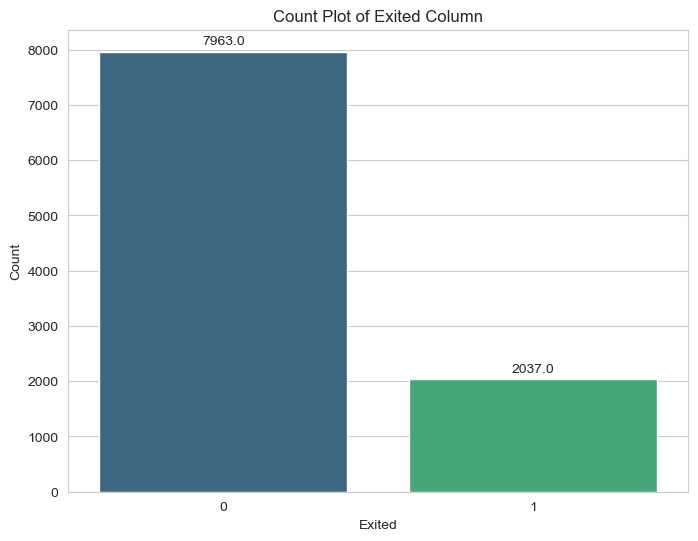

In [19]:
# Count Plot
plt.figure(figsize=(8, 6))
ax = sns.countplot(data=df, x='exited', palette='viridis')

# Adding annotations
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height}', 
                xy=(p.get_x() + p.get_width() / 2., height), 
                xytext=(0, 3), 
                textcoords='offset points', 
                ha='center', 
                va='bottom')
plt.title('Count Plot of Exited Column')
plt.xlabel('Exited')
plt.ylabel('Count')
plt.show()

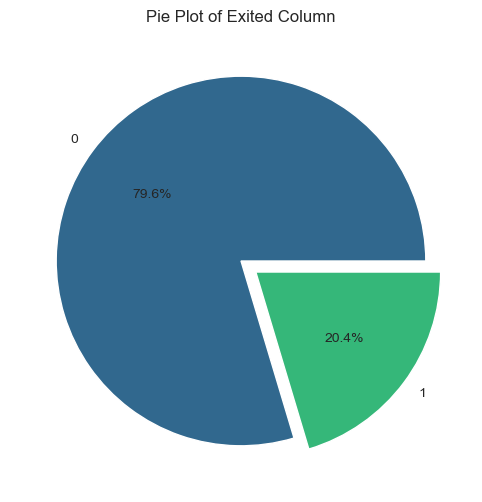

In [20]:
# Pie Plot
excited_counts = df['exited'].value_counts()
plt.figure(figsize=(8, 6))
plt.pie(excited_counts, labels=excited_counts.index, autopct='%1.1f%%', explode = [0, 0.1],colors=sns.color_palette('viridis', len(excited_counts)))
plt.title('Pie Plot of Exited Column')
plt.show()

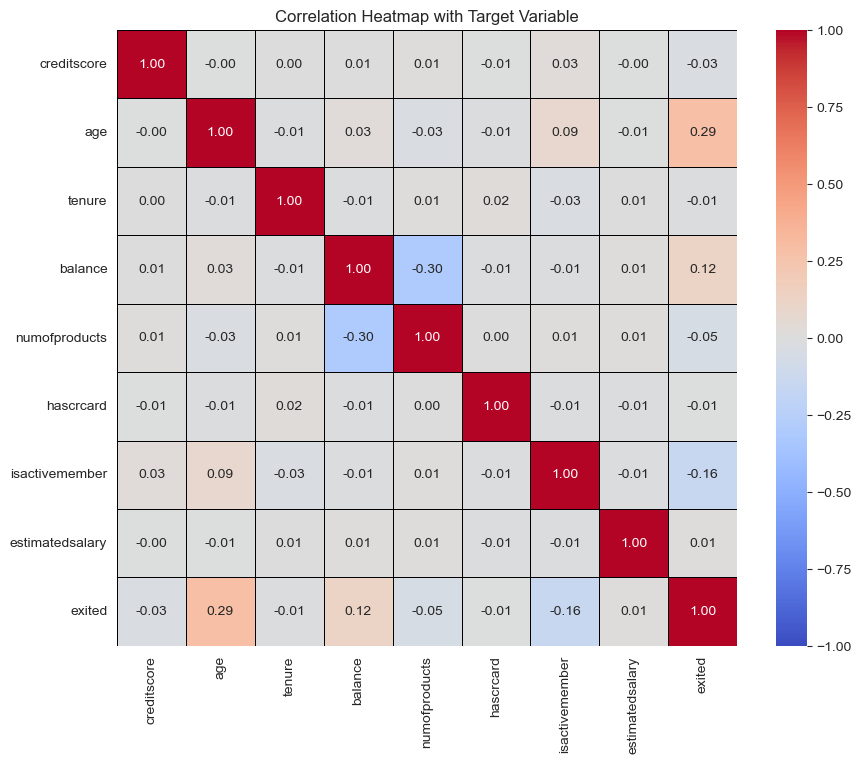

In [21]:
# Calculate correlation matrix with target variable
numeric_df = df.select_dtypes(include=[float, int])  # Select only numeric columns
corr = numeric_df.corr()  # Compute correlation matrix

# Plot correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0,
            linewidths=0.5, linecolor='black', fmt='.2f')
plt.title('Correlation Heatmap with Target Variable')
plt.show()

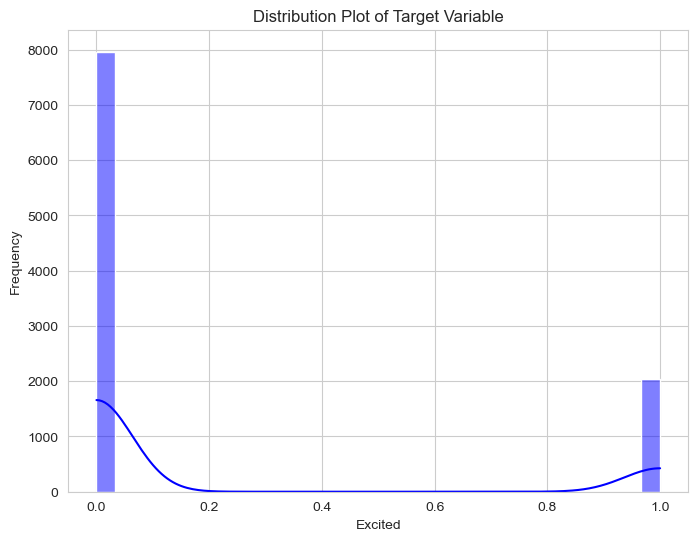

In [22]:
plt.figure(figsize=(8, 6))
sns.histplot(df['exited'], kde=True, bins=30, color='blue')
plt.title('Distribution Plot of Target Variable')
plt.xlabel('Excited')
plt.ylabel('Frequency')
plt.show()

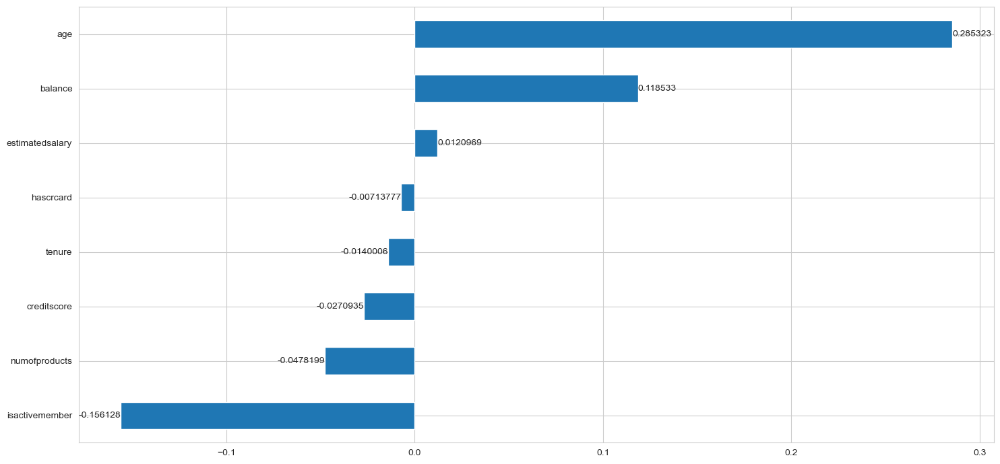

In [23]:
# Select only numeric columns
numeric_df = df.select_dtypes(include=['number'])

# Compute correlation matrix
correlation = numeric_df.corr()

# Get correlations with 'exited'
correlation_exited = correlation["exited"].sort_values().drop("exited")

# Plot the correlations
plt.figure(figsize=(15, 7))
ax = correlation_exited.plot(kind="barh")
ax.bar_label(ax.containers[0])
plt.tight_layout()
plt.show()

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   creditscore      10000 non-null  int64  
 1   geography        10000 non-null  object 
 2   gender           10000 non-null  object 
 3   age              10000 non-null  int64  
 4   tenure           10000 non-null  int64  
 5   balance          10000 non-null  float64
 6   numofproducts    10000 non-null  int64  
 7   hascrcard        10000 non-null  int64  
 8   isactivemember   10000 non-null  int64  
 9   estimatedsalary  10000 non-null  float64
 10  exited           10000 non-null  int64  
dtypes: float64(2), int64(7), object(2)
memory usage: 859.5+ KB


## creditscore

In [25]:
df.creditscore.describe()

count   10,000.00
mean       650.53
std         96.65
min        350.00
25%        584.00
50%        652.00
75%        718.00
max        850.00
Name: creditscore, dtype: float64

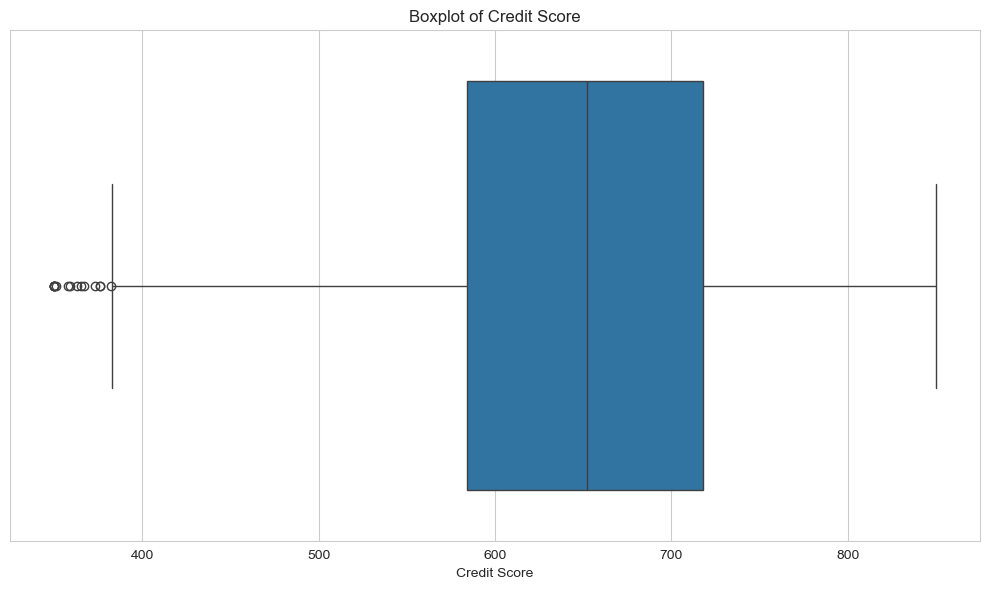

In [26]:
# Plotting the boxplot for 'creditscore'
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['creditscore'])
plt.title('Boxplot of Credit Score')
plt.xlabel('Credit Score')
plt.tight_layout()
plt.show()

####  Generally, credit scores range from 300 to 850, making 300 the lowest possible credit score.

## geography

In [27]:
df.geography.describe()

count      10000
unique         3
top       France
freq        5014
Name: geography, dtype: object

## gender

In [28]:
df.gender.describe()

count     10000
unique        2
top        Male
freq       5457
Name: gender, dtype: object

## age

In [29]:
df.age.describe()

count   10,000.00
mean        38.92
std         10.49
min         18.00
25%         32.00
50%         37.00
75%         44.00
max         92.00
Name: age, dtype: float64

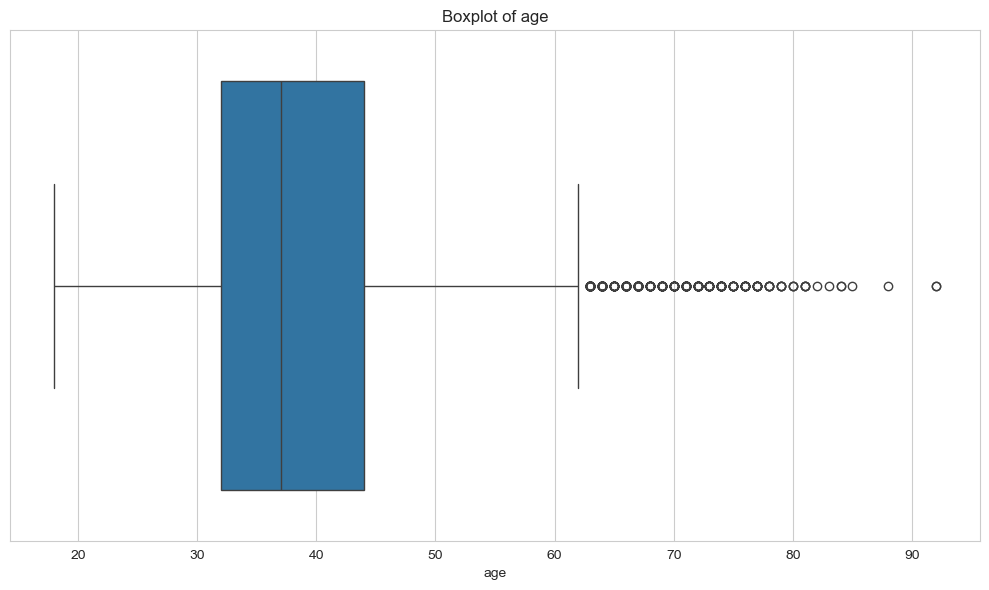

In [30]:
# Plotting the boxplot for 'age'
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['age'])
plt.title('Boxplot of age')
plt.xlabel('age')
plt.tight_layout()
plt.show()

## tenure

In [31]:
df.tenure.describe()

count   10,000.00
mean         5.01
std          2.89
min          0.00
25%          3.00
50%          5.00
75%          7.00
max         10.00
Name: tenure, dtype: float64

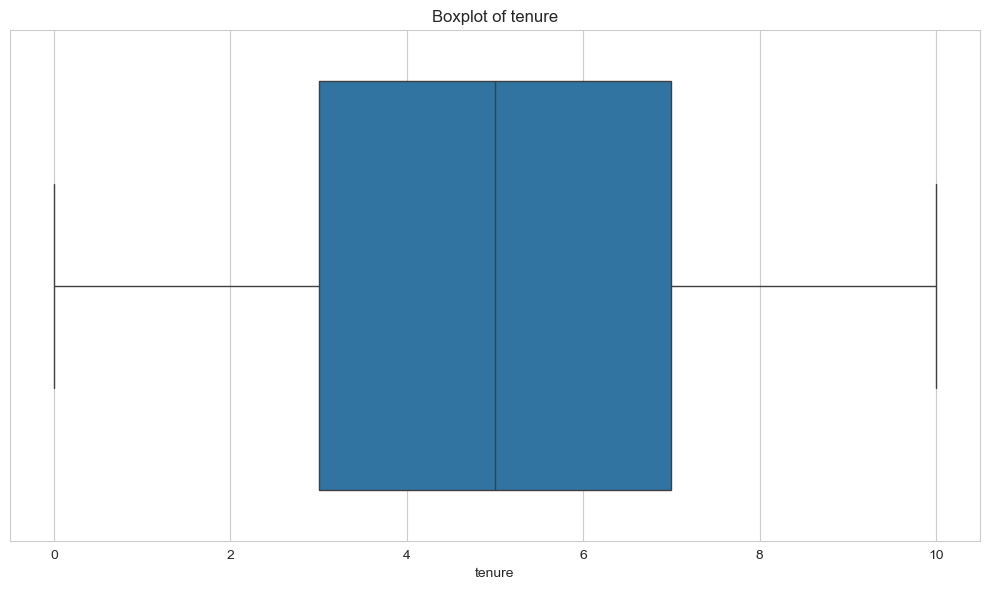

In [32]:
# Plotting the boxplot for 'tenure'
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['tenure'])
plt.title('Boxplot of tenure')
plt.xlabel('tenure')
plt.tight_layout()
plt.show()

## balance

In [33]:
df.balance.describe()

count    10,000.00
mean     76,485.89
std      62,397.41
min           0.00
25%           0.00
50%      97,198.54
75%     127,644.24
max     250,898.09
Name: balance, dtype: float64

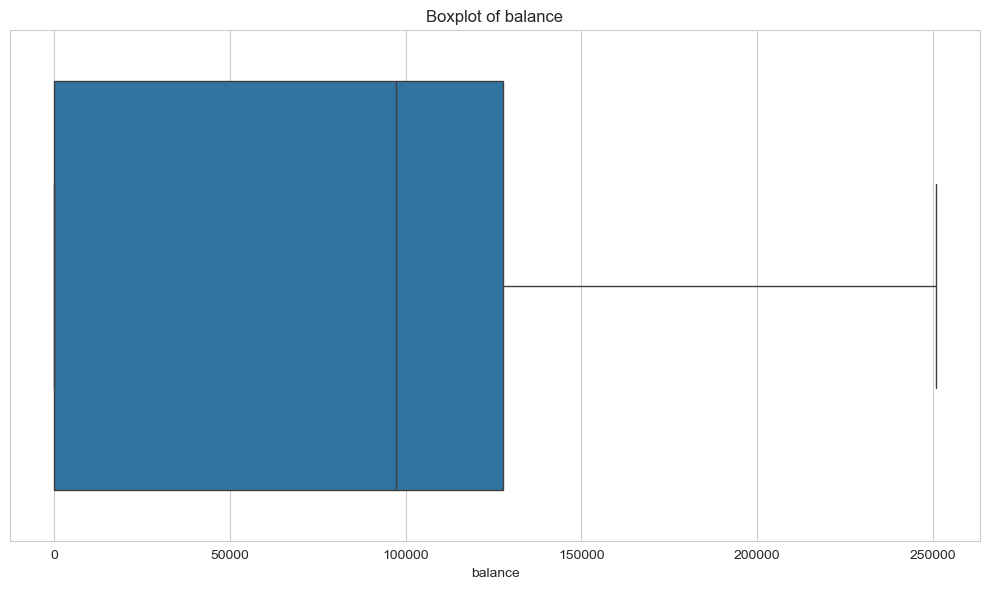

In [34]:
# Plotting the boxplot for 'balance'
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['balance'])
plt.title('Boxplot of balance')
plt.xlabel('balance')
plt.tight_layout()
plt.show()

## numofproducts

In [35]:
df.numofproducts.describe()

count   10,000.00
mean         1.53
std          0.58
min          1.00
25%          1.00
50%          1.00
75%          2.00
max          4.00
Name: numofproducts, dtype: float64

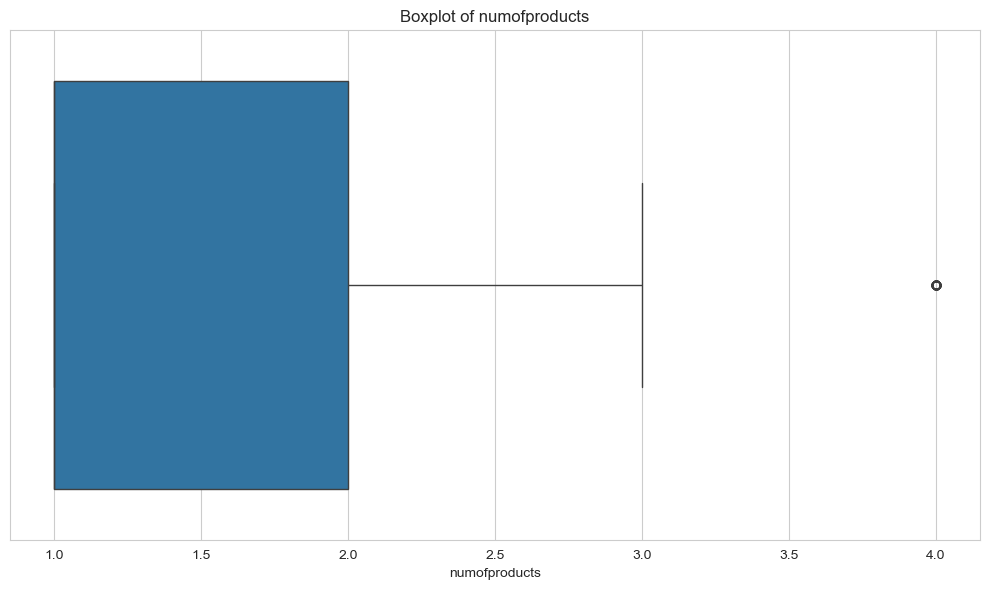

In [36]:
# Plotting the boxplot for 'numofproducts'
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['numofproducts'])
plt.title('Boxplot of numofproducts')
plt.xlabel('numofproducts')
plt.tight_layout()
plt.show()

## estimatedsalary

In [37]:
df.estimatedsalary.describe()

count    10,000.00
mean    100,090.24
std      57,510.49
min          11.58
25%      51,002.11
50%     100,193.91
75%     149,388.25
max     199,992.48
Name: estimatedsalary, dtype: float64

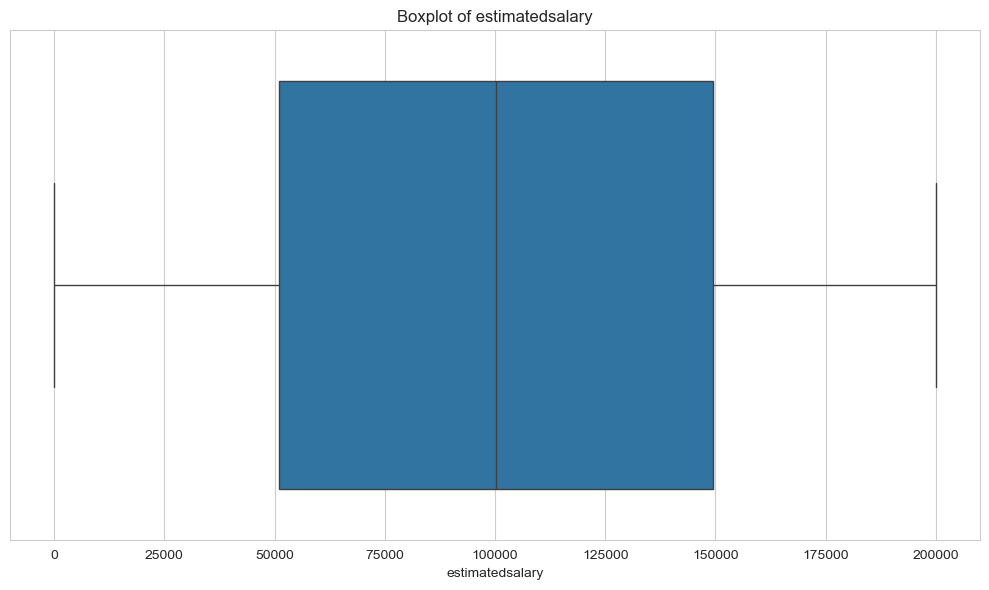

In [38]:
# Plotting the boxplot for 'estimatedsalary'
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['estimatedsalary'])
plt.title('Boxplot of estimatedsalary')
plt.xlabel('estimatedsalary')
plt.tight_layout()
plt.show()

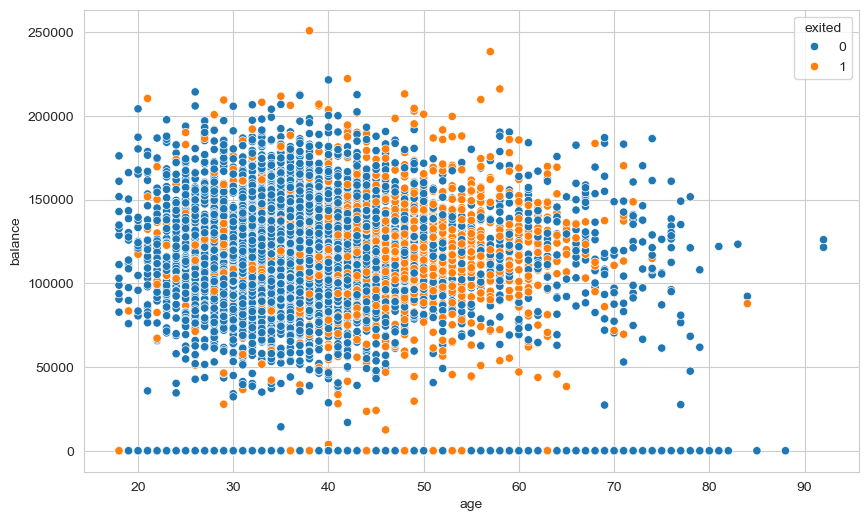

In [39]:
sns.scatterplot(data=df, x="age", y="balance", hue="exited");

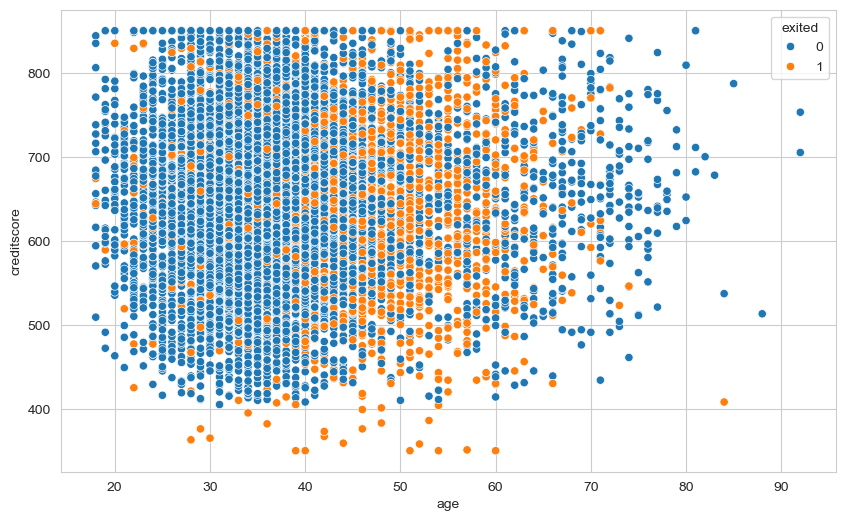

In [40]:
sns.scatterplot(data=df, x="age" ,y="creditscore",  hue="exited");

In [41]:
import nbformat
print("nbformat version:", nbformat.__version__)

nbformat version: 5.10.4


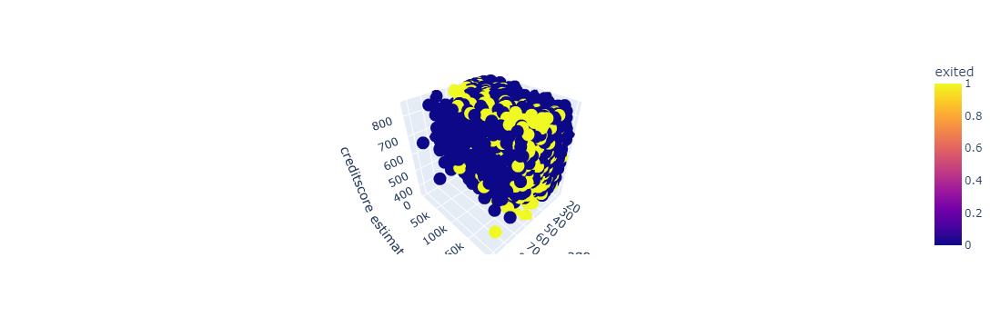

In [42]:

import nbformat
import plotly
fig = px.scatter_3d(df, 
                    x='age',
                    y='estimatedsalary',
                    z='creditscore',
                    color='exited')
fig.show();

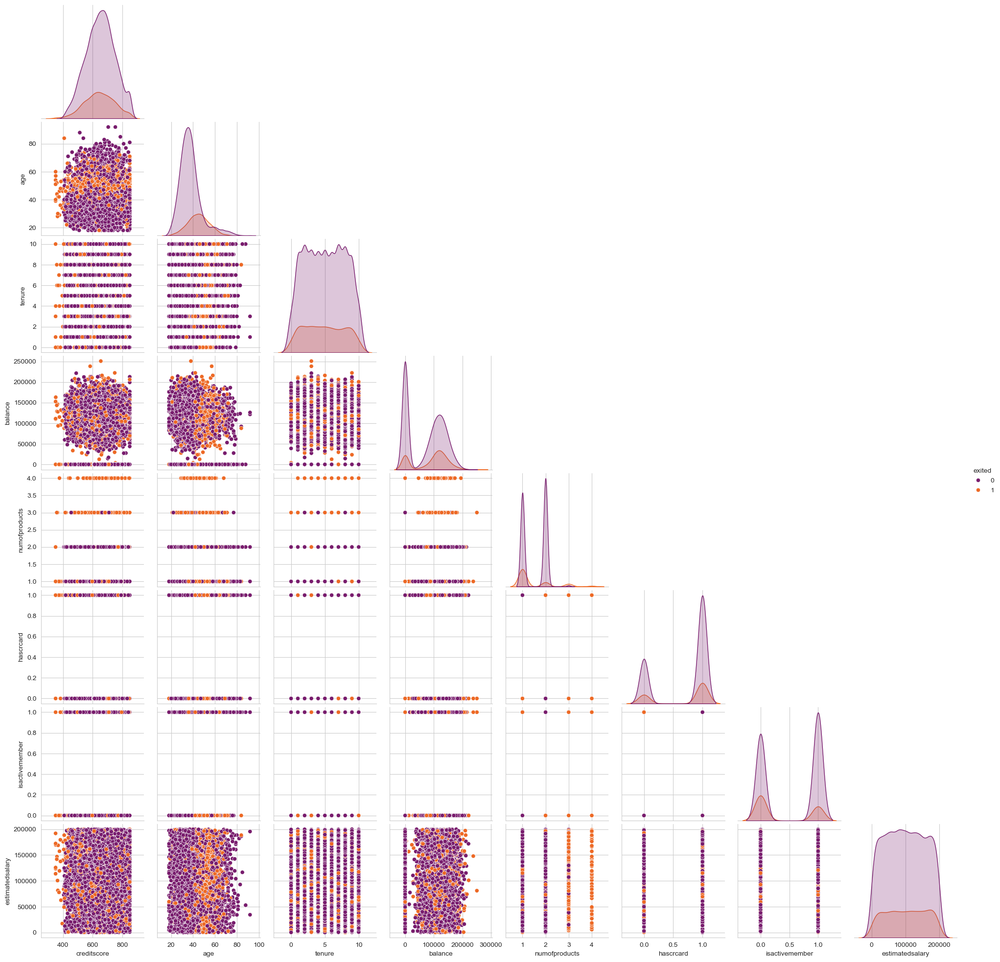

In [421]:
sns.pairplot(df, hue="exited", palette="inferno", corner=True);

## Dummy Operations

In [43]:
cross_tab = pd.crosstab(df['geography'], df['gender'])

In [44]:
cross_tab

gender,Female,Male
geography,,
France,2261,2753
Germany,1193,1316
Spain,1089,1388


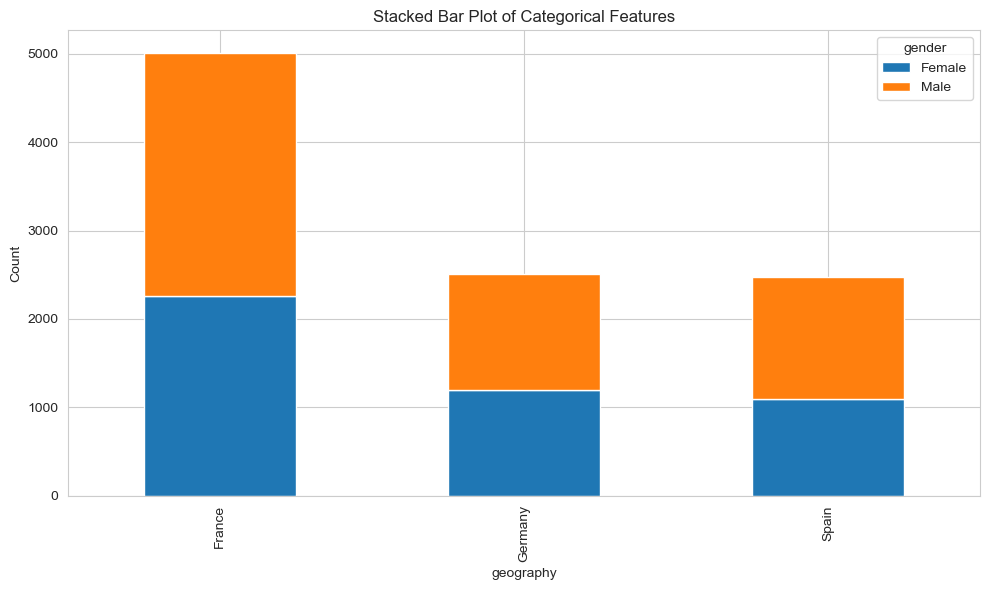

In [45]:
pd.crosstab(df['geography'], df['gender']).plot(kind='bar', stacked=True)
plt.title('Stacked Bar Plot of Categorical Features')
plt.xlabel('geography')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

In [46]:
from scipy.stats import chi2_contingency

contingency_table = pd.crosstab(df['geography'], df['gender'])
chi2, p, _, _ = chi2_contingency(contingency_table)
print(f"Chi-Square Statistic: {chi2}, p-value: {p}")

Chi-Square Statistic: 6.918159617700976, p-value: 0.03145869671789379


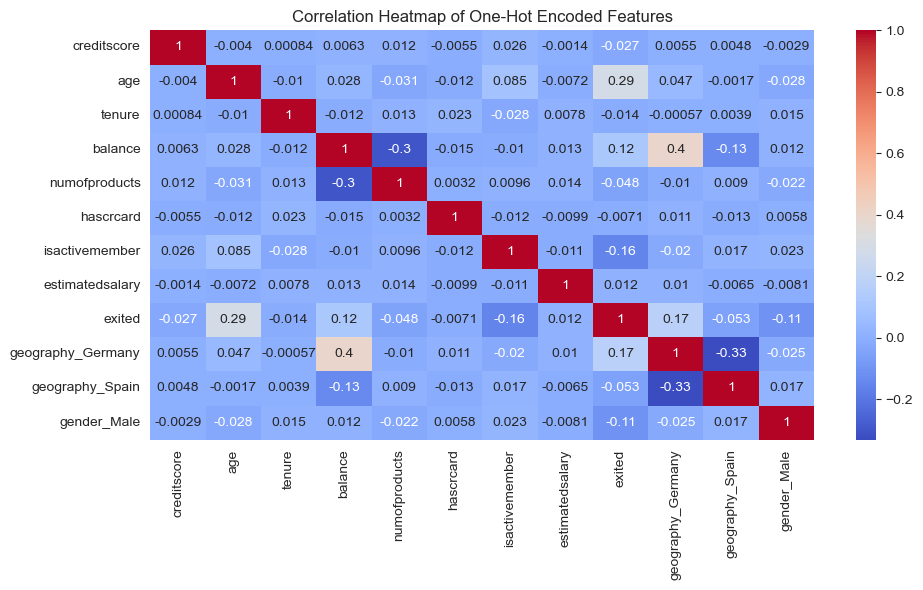

In [47]:
one_hot_encoded_df = pd.get_dummies(df, columns=['geography', 'gender'], drop_first=True)
sns.heatmap(one_hot_encoded_df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap of One-Hot Encoded Features')
plt.tight_layout()
plt.show()

In [48]:
df = pd.get_dummies(df, columns=['geography', 'gender'], drop_first=True)

In [49]:
# Convert any boolean columns to integers
df = df.applymap(lambda x: int(x) if isinstance(x, bool) else x)

In [50]:
df.head(3)

,creditscore,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,exited,geography_Germany,geography_Spain,gender_Male
0,619,42,2,0.00,1,1,1,"101,348.88",1,0,0,0
1,608,41,1,"83,807.86",1,0,1,"112,542.58",0,0,1,0
2,502,42,8,"159,660.80",3,1,0,"113,931.57",1,0,0,0


In [51]:
df.insert(12, 'churn', df['exited'])

In [52]:
# Drop the 'exited' column
df = df.drop(columns=['exited'])

In [53]:
df

,creditscore,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,geography_Germany,geography_Spain,gender_Male,churn
0,619,42,2,0.00,1,1,1,"101,348.88",0,0,0,1
1,608,41,1,"83,807.86",1,0,1,"112,542.58",0,1,0,0
2,502,42,8,"159,660.80",3,1,0,"113,931.57",0,0,0,1
3,699,39,1,0.00,2,0,0,"93,826.63",0,0,0,0
4,850,43,2,"125,510.82",1,1,1,"79,084.10",0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,771,39,5,0.00,2,1,0,"96,270.64",0,0,1,0
9996,516,35,10,"57,369.61",1,1,1,"101,699.77",0,0,1,0
9997,709,36,7,0.00,1,0,1,"42,085.58",0,0,0,1
9998,772,42,3,"75,075.31",2,1,0,"92,888.52",1,0,1,1


# Preprocessing of Data
- Train | Test Split, Scalling

In [54]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

In [55]:
X = df.drop("churn", axis=1)
y = df["churn"]

In [56]:
X

,creditscore,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,geography_Germany,geography_Spain,gender_Male
0,619,42,2,0.00,1,1,1,"101,348.88",0,0,0
1,608,41,1,"83,807.86",1,0,1,"112,542.58",0,1,0
2,502,42,8,"159,660.80",3,1,0,"113,931.57",0,0,0
3,699,39,1,0.00,2,0,0,"93,826.63",0,0,0
4,850,43,2,"125,510.82",1,1,1,"79,084.10",0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,771,39,5,0.00,2,1,0,"96,270.64",0,0,1
9996,516,35,10,"57,369.61",1,1,1,"101,699.77",0,0,1
9997,709,36,7,0.00,1,0,1,"42,085.58",0,0,0
9998,772,42,3,"75,075.31",2,1,0,"92,888.52",1,0,1


In [57]:


# Example seed value
seed = 42

# Assuming X and y are already defined
# X: Input features
# y: Target variable

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.1,
    stratify=y,  
    random_state=seed
)

# Further split the training set into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train,
    test_size=0.1,
    stratify=y_train,
    random_state=seed
)

# Verify the splits
print(f"Training set size: {X_train.shape}")
print(f"Validation set size: {X_val.shape}")
print(f"Testing set size: {X_test.shape}")

Training set size: (8100, 11)
Validation set size: (900, 11)
Testing set size: (1000, 11)


In [58]:
scaler = MinMaxScaler()

In [59]:
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

# Modelling & Model Performance

## without class_weigth

### Create The Model

In [60]:
#!pip install tensorflow

In [61]:
#!pip install scikeras

In [62]:
#!pip install scikit-learn

In [63]:
#pip install --upgrade tensorflow scikeras scikit-learn

In [64]:
#!pip install tensorflow scikeras

In [65]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from scikeras.wrappers import KerasClassifier

from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, RocCurveDisplay
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate, GridSearchCV
from sklearn.preprocessing import StandardScaler

In [66]:
# Define model creation function
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(36, activation="relu", input_dim=input_dim))
    model.add(Dense(18, activation="relu"))
    model.add(Dense(9, activation="relu"))
    model.add(Dense(1, activation="sigmoid"))
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

In [67]:
# Define the number of features (input dimension)
input_dim = X_train.shape[1]

In [68]:
pd.set_option('display.max_rows', 20)  # Change 20 to whatever number of rows you want to display

In [69]:

# Create the model instance
model = create_model(input_dim)
# Train the model and capture the history
history = model.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    batch_size=16,
    epochs=500,
    verbose=1
)

Epoch 1/500
507/507 [==============================] - 2s 2ms/step - loss: 0.4922 - accuracy: 0.7859 - val_loss: 0.4685 - val_accuracy: 0.7900
Epoch 2/500
507/507 [==============================] - 1s 2ms/step - loss: 0.4295 - accuracy: 0.8163 - val_loss: 0.4318 - val_accuracy: 0.8022
Epoch 3/500
507/507 [==============================] - 1s 2ms/step - loss: 0.3875 - accuracy: 0.8360 - val_loss: 0.4099 - val_accuracy: 0.8167
Epoch 4/500
507/507 [==============================] - 1s 2ms/step - loss: 0.3634 - accuracy: 0.8495 - val_loss: 0.3980 - val_accuracy: 0.8256
Epoch 5/500
507/507 [==============================] - 1s 2ms/step - loss: 0.3561 - accuracy: 0.8542 - val_loss: 0.3980 - val_accuracy: 0.8378
Epoch 6/500
507/507 [==============================] - 1s 2ms/step - loss: 0.3519 - accuracy: 0.8525 - val_loss: 0.3932 - val_accuracy: 0.8389
Epoch 7/500
507/507 [==============================] - 1s 2ms/step - loss: 0.3482 - accuracy: 0.8551 - val_loss: 0.3881 - val_accuracy: 0.8389

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8810 - loss: 0.2786 - val_accuracy: 0.8256 - val_loss: 0.5075
Epoch 247/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8877 - loss: 0.2642 - val_accuracy: 0.8122 - val_loss: 0.5054
Epoch 248/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8894 - loss: 0.2652 - val_accuracy: 0.8233 - val_loss: 0.5007
Epoch 249/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8870 - loss: 0.2649 - val_accuracy: 0.8189 - val_loss: 0.5121
Epoch 250/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8903 - loss: 0.2714 - val_accuracy: 0.8144 - val_loss: 0.5194
Epoch 251/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8872 - loss: 0.2616 - val_accuracy: 0.8289 - val_loss: 0.5107
Epoch 252/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8834 - loss: 0.2715 - val_accuracy: 0.8267 - val_loss: 0.5045
Epoch 253/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8912 - loss: 0.2587 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8940 - loss: 0.2531 - val_accuracy: 0.8178 - val_loss: 0.5295
Epoch 296/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8855 - loss: 0.2599 - val_accuracy: 0.8256 - val_loss: 0.5526
Epoch 297/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8894 - loss: 0.2568 - val_accuracy: 0.8211 - val_loss: 0.5339
Epoch 298/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8965 - loss: 0.2621 - val_accuracy: 0.8122 - val_loss: 0.5239
Epoch 299/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8952 - loss: 0.2543 - val_accuracy: 0.8233 - val_loss: 0.5536
Epoch 300/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8893 - loss: 0.2635 - val_accuracy: 0.8244 - val_loss: 0.5519
Epoch 301/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8916 - loss: 0.2602 - val_accuracy: 0.8211 - val_loss: 0.5510
Epoch 302/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8945 - loss: 0.2546 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9002 - loss: 0.2459 - val_accuracy: 0.8289 - val_loss: 0.5734
Epoch 345/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9017 - loss: 0.2467 - val_accuracy: 0.8189 - val_loss: 0.5743
Epoch 346/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8937 - loss: 0.2516 - val_accuracy: 0.8233 - val_loss: 0.5617
Epoch 347/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8992 - loss: 0.2489 - val_accuracy: 0.8200 - val_loss: 0.5545
Epoch 348/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8938 - loss: 0.2498 - val_accuracy: 0.8211 - val_loss: 0.5735
Epoch 349/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8997 - loss: 0.2464 - val_accuracy: 0.8256 - val_loss: 0.5838
Epoch 350/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8993 - loss: 0.2420 - val_accuracy: 0.8211 - val_loss: 0.5583
Epoch 351/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8963 - loss: 0.2509 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8967 - loss: 0.2462 - val_accuracy: 0.8167 - val_loss: 0.6034
Epoch 394/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8988 - loss: 0.2369 - val_accuracy: 0.8189 - val_loss: 0.6004
Epoch 395/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8985 - loss: 0.2480 - val_accuracy: 0.8267 - val_loss: 0.5953
Epoch 396/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8990 - loss: 0.2466 - val_accuracy: 0.8211 - val_loss: 0.6125
Epoch 397/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8939 - loss: 0.2504 - val_accuracy: 0.8211 - val_loss: 0.6122
Epoch 398/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9006 - loss: 0.2366 - val_accuracy: 0.8267 - val_loss: 0.6002
Epoch 399/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8922 - loss: 0.2472 - val_accuracy: 0.8278 - val_loss: 0.5914
Epoch 400/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9028 - loss: 0.2479 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9099 - loss: 0.2274 - val_accuracy: 0.8256 - val_loss: 0.6023
Epoch 443/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9039 - loss: 0.2393 - val_accuracy: 0.8178 - val_loss: 0.6319
Epoch 444/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9038 - loss: 0.2315 - val_accuracy: 0.8244 - val_loss: 0.6423
Epoch 445/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9026 - loss: 0.2333 - val_accuracy: 0.8167 - val_loss: 0.6248
Epoch 446/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9083 - loss: 0.2284 - val_accuracy: 0.8178 - val_loss: 0.6194
Epoch 447/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9043 - loss: 0.2298 - val_accuracy: 0.8200 - val_loss: 0.6316
Epoch 448/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8996 - loss: 0.2419 - val_accuracy: 0.8256 - val_loss: 0.6382
Epoch 449/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9035 - loss: 0.2296 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8978 - loss: 0.2418 - val_accuracy: 0.8133 - val_loss: 0.6436
Epoch 492/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9048 - loss: 0.2275 - val_accuracy: 0.8267 - val_loss: 0.6329
Epoch 493/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9021 - loss: 0.2341 - val_accuracy: 0.8222 - val_loss: 0.6646
Epoch 494/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9016 - loss: 0.2339 - val_accuracy: 0.8189 - val_loss: 0.6507
Epoch 495/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8995 - loss: 0.2269 - val_accuracy: 0.8167 - val_loss: 0.6657
Epoch 496/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9075 - loss: 0.2228 - val_accuracy: 0.8289 - val_loss: 0.6619
Epoch 497/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9030 - loss: 0.2296 - val_accuracy: 0.8189 - val_loss: 0.6521
Epoch 498/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9041 - loss: 0.2312 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9050 - loss: 0.2251 - val_accuracy: 0.8211 - val_loss: 0.6924
Epoch 541/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8986 - loss: 0.2341 - val_accuracy: 0.8244 - val_loss: 0.6707
Epoch 542/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9008 - loss: 0.2329 - val_accuracy: 0.8222 - val_loss: 0.6820
Epoch 543/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9075 - loss: 0.2171 - val_accuracy: 0.8233 - val_loss: 0.6694
Epoch 544/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9059 - loss: 0.2311 - val_accuracy: 0.8278 - val_loss: 0.6924
Epoch 545/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9078 - loss: 0.2282 - val_accuracy: 0.8067 - val_loss: 0.7014
Epoch 546/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9070 - loss: 0.2231 - val_accuracy: 0.8244 - val_loss: 0.6835
Epoch 547/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9099 - loss: 0.2234 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9081 - loss: 0.2256 - val_accuracy: 0.8200 - val_loss: 0.7407
Epoch 590/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9109 - loss: 0.2109 - val_accuracy: 0.8156 - val_loss: 0.7303
Epoch 591/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8971 - loss: 0.2385 - val_accuracy: 0.8244 - val_loss: 0.7146
Epoch 592/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9053 - loss: 0.2222 - val_accuracy: 0.8133 - val_loss: 0.7666
Epoch 593/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9078 - loss: 0.2195 - val_accuracy: 0.8200 - val_loss: 0.7317
Epoch 594/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9042 - loss: 0.2263 - val_accuracy: 0.8178 - val_loss: 0.7419
Epoch 595/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9067 - loss: 0.2210 - val_accuracy: 0.8178 - val_loss: 0.7233
Epoch 596/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9061 - loss: 0.2302 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9014 - loss: 0.2306 - val_accuracy: 0.8144 - val_loss: 0.7842
Epoch 639/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9124 - loss: 0.2121 - val_accuracy: 0.8222 - val_loss: 0.7789
Epoch 640/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9082 - loss: 0.2143 - val_accuracy: 0.8111 - val_loss: 0.7503
Epoch 641/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9041 - loss: 0.2312 - val_accuracy: 0.8156 - val_loss: 0.7936
Epoch 642/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9055 - loss: 0.2167 - val_accuracy: 0.8067 - val_loss: 0.7642
Epoch 643/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9041 - loss: 0.2242 - val_accuracy: 0.8167 - val_loss: 0.8082
Epoch 644/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9043 - loss: 0.2308 - val_accuracy: 0.8189 - val_loss: 0.7818
Epoch 645/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9038 - loss: 0.2263 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9108 - loss: 0.2187 - val_accuracy: 0.8122 - val_loss: 0.7651
Epoch 688/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9075 - loss: 0.2216 - val_accuracy: 0.8222 - val_loss: 0.8461
Epoch 689/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9122 - loss: 0.2127 - val_accuracy: 0.8167 - val_loss: 0.8239
Epoch 690/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9067 - loss: 0.2189 - val_accuracy: 0.8233 - val_loss: 0.8150
Epoch 691/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9069 - loss: 0.2248 - val_accuracy: 0.8244 - val_loss: 0.8325
Epoch 692/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9122 - loss: 0.2133 - val_accuracy: 0.8167 - val_loss: 0.7864
Epoch 693/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9052 - loss: 0.2221 - val_accuracy: 0.8133 - val_loss: 0.7493
Epoch 694/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9115 - loss: 0.2177 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9140 - loss: 0.2158 - val_accuracy: 0.8222 - val_loss: 0.8295
Epoch 737/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9121 - loss: 0.2124 - val_accuracy: 0.8156 - val_loss: 0.8744
Epoch 738/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9103 - loss: 0.2119 - val_accuracy: 0.8189 - val_loss: 0.8560
Epoch 739/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9073 - loss: 0.2157 - val_accuracy: 0.8189 - val_loss: 0.8396
Epoch 740/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9105 - loss: 0.2076 - val_accuracy: 0.8133 - val_loss: 0.8666
Epoch 741/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9079 - loss: 0.2189 - val_accuracy: 0.8200 - val_loss: 0.8593
Epoch 742/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9110 - loss: 0.2118 - val_accuracy: 0.8144 - val_loss: 0.8049
Epoch 743/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9043 - loss: 0.2287 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9039 - loss: 0.2319 - val_accuracy: 0.8156 - val_loss: 0.8631
Epoch 786/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9101 - loss: 0.2080 - val_accuracy: 0.8189 - val_loss: 0.8430
Epoch 787/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9084 - loss: 0.2237 - val_accuracy: 0.8178 - val_loss: 0.9056
Epoch 788/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9110 - loss: 0.2212 - val_accuracy: 0.8100 - val_loss: 0.8918
Epoch 789/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9094 - loss: 0.2194 - val_accuracy: 0.8200 - val_loss: 0.8618
Epoch 790/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9069 - loss: 0.2228 - val_accuracy: 0.8167 - val_loss: 0.8926
Epoch 791/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9032 - loss: 0.2257 - val_accuracy: 0.8211 - val_loss: 0.8492
Epoch 792/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9137 - loss: 0.2025 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9148 - loss: 0.2118 - val_accuracy: 0.8178 - val_loss: 0.8995
Epoch 835/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9142 - loss: 0.2107 - val_accuracy: 0.8178 - val_loss: 0.9137
Epoch 836/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9136 - loss: 0.2157 - val_accuracy: 0.8244 - val_loss: 0.8772
Epoch 837/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9156 - loss: 0.2051 - val_accuracy: 0.8200 - val_loss: 0.9069
Epoch 838/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9173 - loss: 0.2046 - val_accuracy: 0.8156 - val_loss: 0.8492
Epoch 839/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9128 - loss: 0.2091 - val_accuracy: 0.8178 - val_loss: 0.9138
Epoch 840/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9033 - loss: 0.2203 - val_accuracy: 0.8256 - val_loss: 0.9168
Epoch 841/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9105 - loss: 0.2132 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9072 - loss: 0.2146 - val_accuracy: 0.8233 - val_loss: 0.8983
Epoch 884/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9109 - loss: 0.2060 - val_accuracy: 0.8133 - val_loss: 0.8968
Epoch 885/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9075 - loss: 0.2192 - val_accuracy: 0.8133 - val_loss: 0.9237
Epoch 886/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9124 - loss: 0.2091 - val_accuracy: 0.8256 - val_loss: 0.9390
Epoch 887/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9142 - loss: 0.2085 - val_accuracy: 0.8089 - val_loss: 0.8897
Epoch 888/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9118 - loss: 0.2050 - val_accuracy: 0.8178 - val_loss: 0.8971
Epoch 889/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9146 - loss: 0.2056 - val_accuracy: 0.8200 - val_loss: 0.8465
Epoch 890/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9112 - loss: 0.2169 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9127 - loss: 0.2048 - val_accuracy: 0.8256 - val_loss: 0.9540
Epoch 933/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9144 - loss: 0.2068 - val_accuracy: 0.8244 - val_loss: 0.9099
Epoch 934/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9073 - loss: 0.2309 - val_accuracy: 0.8133 - val_loss: 1.0005
Epoch 935/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - accuracy: 0.9119 - loss: 0.2089 - val_accuracy: 0.8100 - val_loss: 0.9754
Epoch 936/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - accuracy: 0.9138 - loss: 0.2068 - val_accuracy: 0.8200 - val_loss: 0.9022
Epoch 937/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9082 - loss: 0.2148 - val_accuracy: 0.8233 - val_loss: 0.8663
Epoch 938/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step - accuracy: 0.9091 - loss: 0.2125 - val_accuracy: 0.8156 - val_loss: 0.9043
Epoch 939/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - accuracy: 0.9117 - loss: 

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - accuracy: 0.9089 - loss: 0.2128 - val_accuracy: 0.8133 - val_loss: 0.9808
Epoch 982/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 953us/step - accuracy: 0.9087 - loss: 0.2135 - val_accuracy: 0.8178 - val_loss: 0.9914
Epoch 983/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 961us/step - accuracy: 0.9093 - loss: 0.2178 - val_accuracy: 0.8178 - val_loss: 0.9707
Epoch 984/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - accuracy: 0.9195 - loss: 0.2039 - val_accuracy: 0.8100 - val_loss: 0.9001
Epoch 985/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - accuracy: 0.9175 - loss: 0.2050 - val_accuracy: 0.8167 - val_loss: 0.9150
Epoch 986/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - accuracy: 0.9200 - loss: 0.1982 - val_accuracy: 0.8133 - val_loss: 0.9559
Epoch 987/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 968us/step - accuracy: 0.9120 - loss: 0.2211 - val_accuracy: 0.8122 - val_loss: 0.9129
Epoch 988/1000
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9115 - 

In [70]:

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 36)                432       
                                                                 
 dense_1 (Dense)             (None, 18)                666       
                                                                 
 dense_2 (Dense)             (None, 9)                 171       
                                                                 
 dense_3 (Dense)             (None, 1)                 10        
                                                                 
Total params: 1,279
Trainable params: 1,279
Non-trainable params: 0
_________________________________________________________________


In [71]:
model_dict = {}

### Evaluate The Model

- Plot the model history to observe the changing of metrics
- Make prediction to see "confusion matrix" and "classification report"
- Check ROC (Receiver Operating Curve) and AUC (Area Under Curve) for the model

In [72]:
model.evaluate(X_test, y_test, verbose=0)

[0.519790768623352, 0.8169999718666077]

In [82]:
history_dict_model = history.history
history_dict_model

{'loss': [0.4921799600124359,
  0.4294627606868744,
  0.38745206594467163,
  0.3634369969367981,
  0.3560979664325714,
  0.3518716096878052,
  0.3481881022453308,
  0.34705850481987,
  0.3456323444843292,
  0.34302085638046265,
  0.34355786442756653,
  0.34201982617378235,
  0.34059426188468933,
  0.3395879566669464,
  0.33831512928009033,
  0.33869633078575134,
  0.3371995985507965,
  0.3376256823539734,
  0.3363281488418579,
  0.3347616195678711,
  0.3355790972709656,
  0.3344883322715759,
  0.33299699425697327,
  0.33261772990226746,
  0.33325618505477905,
  0.3317279517650604,
  0.3312733769416809,
  0.3312590718269348,
  0.3306482434272766,
  0.3307463526725769,
  0.32984596490859985,
  0.3280954658985138,
  0.3288331925868988,
  0.3279763460159302,
  0.3276831805706024,
  0.32684436440467834,
  0.3268391788005829,
  0.32618701457977295,
  0.32459473609924316,
  0.32587161660194397,
  0.3249029815196991,
  0.3240780532360077,
  0.3247842490673065,
  0.3229121267795563,
  0.3206722

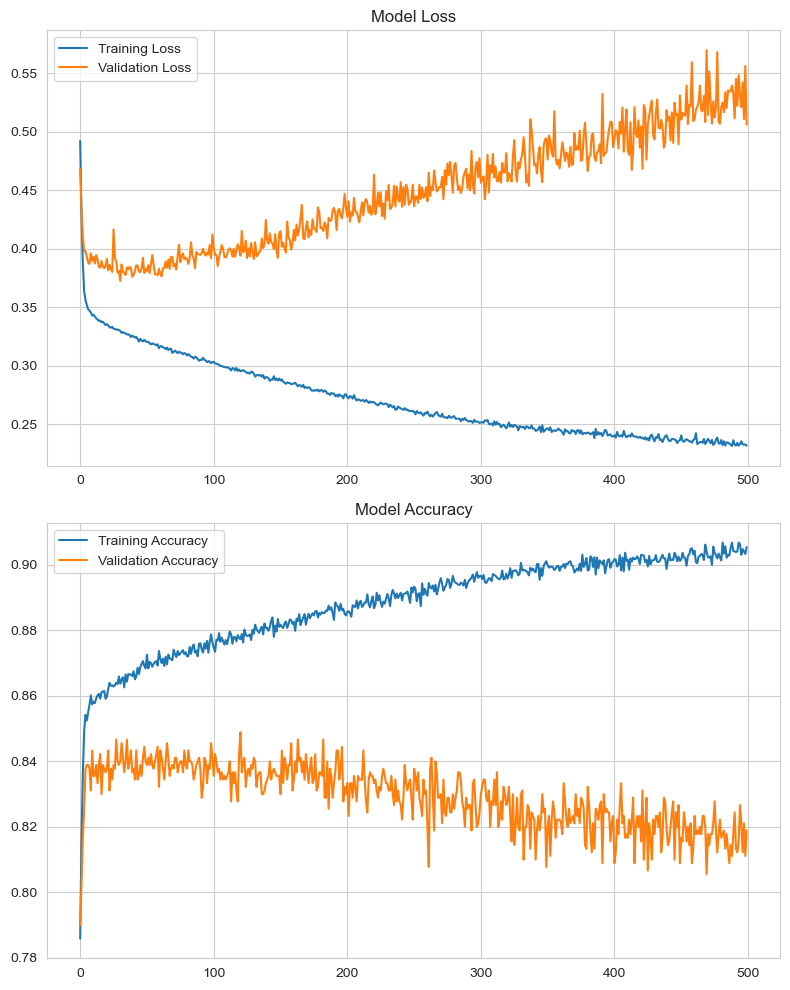

In [83]:
# Assuming 'history' is the history object from model.fit
history_dict_model = history.history

# Create subplots
fig, axes = plt.subplots(2, 1, figsize=(8, 10))

# Plot loss
axes[0].plot(history_dict_model["loss"], label="Training Loss")
axes[0].plot(history_dict_model["val_loss"], label="Validation Loss")
axes[0].set_title("Model Loss")
axes[0].legend()

# Plot accuracy
axes[1].plot(history_dict_model["accuracy"], label="Training Accuracy")
axes[1].plot(history_dict_model["val_accuracy"], label="Validation Accuracy")
axes[1].set_title("Model Accuracy")
axes[1].legend()

# Show the plots
plt.tight_layout()
plt.show()

In [74]:
model.history.history

{}

In [84]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)

print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.519790768623352
accuracy :  0.8169999718666077


In [85]:
# Adding loss and accuracy values
model_dict['model_loss'] = loss
model_dict['model_accuracy'] = accuracy
model_dict

{'model_loss': 0.519790768623352, 'model_accuracy': 0.8169999718666077}

In [86]:
# Predict on the test set
y_pred = (model.predict(X_test) > 0.5).astype("int32")

# Print confusion matrix
print(confusion_matrix(y_test, y_pred))

# Print classification report
print(classification_report(y_test, y_pred))

32/32 [==============================] - 0s 1ms/step
[[726  70]
 [113  91]]
              precision    recall  f1-score   support

           0       0.87      0.91      0.89       796
           1       0.57      0.45      0.50       204

    accuracy                           0.82      1000
   macro avg       0.72      0.68      0.69      1000
weighted avg       0.80      0.82      0.81      1000



32/32 [==============================] - 0s 940us/step
ROC AUC: 0.7879


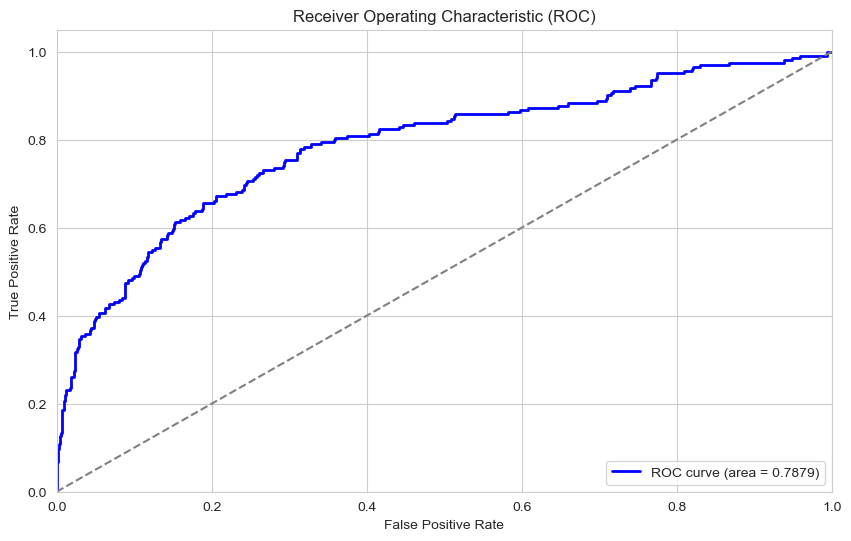

In [87]:
# Assuming you have your model, X_test, and y_test already prepared and trained
# Predict probabilities on the test set
y_pred_proba = model.predict(X_test).flatten()

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate ROC AUC
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print ROC AUC
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

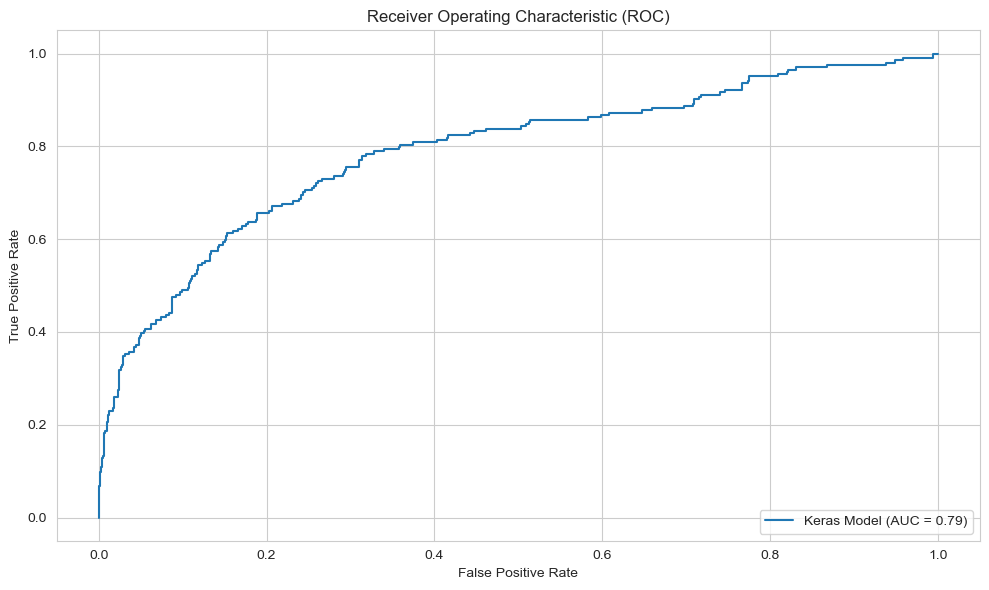

In [88]:
# Calculate ROC curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)

# Calculate ROC AUC
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Create and plot the ROC curve
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='Keras Model')
roc_display.plot()

plt.title('Receiver Operating Characteristic (ROC)')
plt.tight_layout()
plt.show()

## with class_weigth

Investigate how the "class_weight" hyper-parameter is used in a Neural Network.

### Create The Model

In [89]:
import numpy as np
from sklearn.utils import class_weight
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

In [90]:


# Example seed value
seed = 42

# Assuming X and y are already defined
# X: Input features
# y: Target variable

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.1,
    stratify=y,  
    random_state=seed
)

# Further split the training set into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train,
    test_size=0.1,
    stratify=y_train,
    random_state=seed
)

# Verify the splits
print(f"Training set size: {X_train.shape}")
print(f"Validation set size: {X_val.shape}")
print(f"Testing set size: {X_test.shape}")

Training set size: (8100, 11)
Validation set size: (900, 11)
Testing set size: (1000, 11)


In [91]:
scaler = MinMaxScaler()

In [92]:
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

In [93]:

# Define the number of features (input dimension)
input_dim = X_train.shape[1]

In [94]:
X_train.shape[1]

11

In [95]:
y_train = y_train.astype(int)

In [96]:

# Verify unique class labels in y_train
unique_classes = np.unique(y_train)
print(f"Unique classes in y_train: {unique_classes}")



Unique classes in y_train: [0 1]


In [97]:
# Verify unique class labels in y_train
unique_classes = np.unique(y_val)
print(f"Unique classes in y_val: {unique_classes}")

Unique classes in y_val: [0 1]


In [98]:
def generate_sample_weights(training_data, class_weights):
    # Create a numpy array of sample weights with the same shape as training_data
    sample_weights = np.array([class_weights.get(y, 1.0) for y in training_data])
    return sample_weights

In [99]:
# Compute class weights
class_weights_array = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)

class_weights_dict = dict(enumerate(class_weights_array))
print("Class weights:", class_weights_dict)

Class weights: {0: 0.627906976744186, 1: 2.4545454545454546}


In [100]:
# Create the model instance
model_weighted = create_model(input_dim)

# Train the model with class weights
history = model_weighted.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    class_weight=class_weights_dict,
    batch_size=32,
    epochs=500,
    verbose=1
)      

Epoch 1/500
254/254 [==============================] - 1s 3ms/step - loss: 0.6409 - accuracy: 0.5970 - val_loss: 0.6013 - val_accuracy: 0.6889
Epoch 2/500
254/254 [==============================] - 1s 2ms/step - loss: 0.5904 - accuracy: 0.6902 - val_loss: 0.5317 - val_accuracy: 0.7633
Epoch 3/500
254/254 [==============================] - 1s 2ms/step - loss: 0.5643 - accuracy: 0.7165 - val_loss: 0.5231 - val_accuracy: 0.7544
Epoch 4/500
254/254 [==============================] - 1s 2ms/step - loss: 0.5388 - accuracy: 0.7383 - val_loss: 0.5198 - val_accuracy: 0.7578
Epoch 5/500
254/254 [==============================] - 1s 2ms/step - loss: 0.5095 - accuracy: 0.7575 - val_loss: 0.5832 - val_accuracy: 0.7189
Epoch 6/500
254/254 [==============================] - 1s 2ms/step - loss: 0.4953 - accuracy: 0.7640 - val_loss: 0.5145 - val_accuracy: 0.7667
Epoch 7/500
254/254 [==============================] - 1s 2ms/step - loss: 0.4840 - accuracy: 0.7688 - val_loss: 0.5150 - val_accuracy: 0.7533

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



254/254 [==============================] - 1s 3ms/step - loss: 0.2939 - accuracy: 0.8641 - val_loss: 0.6561 - val_accuracy: 0.7600
Epoch 474/500
254/254 [==============================] - 1s 2ms/step - loss: 0.3004 - accuracy: 0.8543 - val_loss: 0.6052 - val_accuracy: 0.7900
Epoch 475/500
254/254 [==============================] - 1s 2ms/step - loss: 0.2980 - accuracy: 0.8589 - val_loss: 0.6383 - val_accuracy: 0.7744
Epoch 476/500
254/254 [==============================] - 1s 2ms/step - loss: 0.2988 - accuracy: 0.8547 - val_loss: 0.6631 - val_accuracy: 0.7578
Epoch 477/500
254/254 [==============================] - 1s 2ms/step - loss: 0.3014 - accuracy: 0.8567 - val_loss: 0.6908 - val_accuracy: 0.7511
Epoch 478/500
254/254 [==============================] - 1s 2ms/step - loss: 0.2973 - accuracy: 0.8580 - val_loss: 0.6037 - val_accuracy: 0.8033
Epoch 479/500
254/254 [==============================] - 1s 2ms/step - loss: 0.2948 - accuracy: 0.8626 - val_loss: 0.6224 - val_accuracy: 0.7833

### Evaluate The Model

- Plot the model history to observe the changing of metrics
- Make prediction to see "confusion matrix" and "classification report"
- Check ROC (Receiver Operating Curve) and AUC (Area Under Curve) for the model

In [101]:
model_weighted.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 36)                432       
                                                                 
 dense_5 (Dense)             (None, 18)                666       
                                                                 
 dense_6 (Dense)             (None, 9)                 171       
                                                                 
 dense_7 (Dense)             (None, 1)                 10        
                                                                 
Total params: 1,279
Trainable params: 1,279
Non-trainable params: 0
_________________________________________________________________


In [106]:
loss_df = pd.DataFrame(history.history)
loss_df.head()

,loss,accuracy,val_loss,val_accuracy
0,0.64,0.60,0.60,0.69
1,0.59,0.69,0.53,0.76
2,0.56,0.72,0.52,0.75
3,0.54,0.74,0.52,0.76
4,0.51,0.76,0.58,0.72


In [107]:
model_weighted.evaluate(X_test, y_test, verbose=0)

[0.6227505207061768, 0.7900000214576721]

In [108]:
loss, accuracy = model_weighted.evaluate(X_test, y_test, verbose=0)

print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.6227505207061768
accuracy :  0.7900000214576721


In [109]:
# Adding loss and accuracy values
model_dict['model_weighted_loss'] = loss
model_dict['model_weighted_accuracy'] = accuracy
model_dict

{'model_loss': 0.519790768623352,
 'model_accuracy': 0.8169999718666077,
 'model_weighted_loss': 0.6227505207061768,
 'model_weighted_accuracy': 0.7900000214576721}

In [110]:
# Predict on the test set
y_pred = (model_weighted.predict(X_test) > 0.5).astype("int32")

# Print confusion matrix
print(confusion_matrix(y_test, y_pred))

# Print classification report
print(classification_report(y_test, y_pred))

32/32 [==============================] - 0s 954us/step
[[656 140]
 [ 70 134]]
              precision    recall  f1-score   support

           0       0.90      0.82      0.86       796
           1       0.49      0.66      0.56       204

    accuracy                           0.79      1000
   macro avg       0.70      0.74      0.71      1000
weighted avg       0.82      0.79      0.80      1000



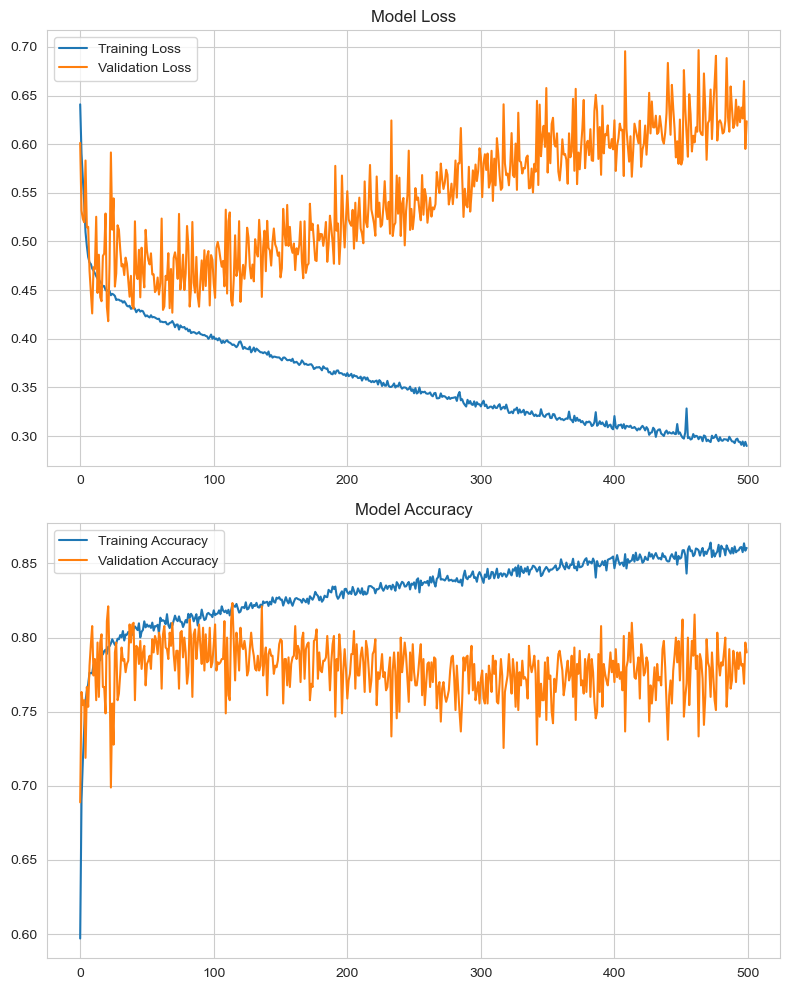

In [111]:
# Create subplots
fig, axes = plt.subplots(2, 1, figsize=(8, 10))

# Plot loss
axes[0].plot(loss_df["loss"], label="Training Loss")
axes[0].plot(loss_df["val_loss"], label="Validation Loss")
axes[0].set_title("Model Loss")
axes[0].legend()

# Plot accuracy
axes[1].plot(loss_df["accuracy"], label="Training Accuracy")
axes[1].plot(loss_df["val_accuracy"], label="Validation Accuracy")
axes[1].set_title("Model Accuracy")
axes[1].legend()

# Show the plots
plt.tight_layout()
plt.show()

32/32 [==============================] - 0s 1ms/step
ROC AUC: 0.7912


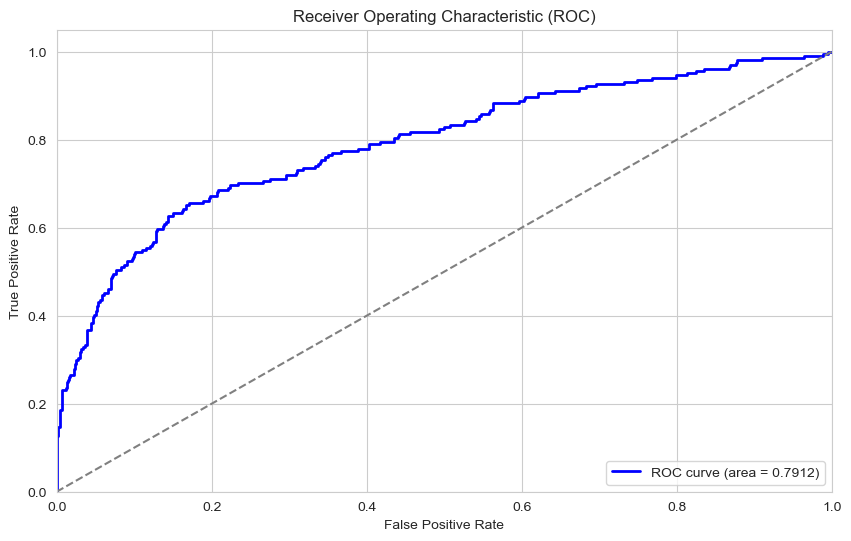

In [112]:
# Assuming you have your model, X_test, and y_test already prepared and trained
# Predict probabilities on the test set
y_pred_proba = model_weighted.predict(X_test).flatten()

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate ROC AUC
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print ROC AUC
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

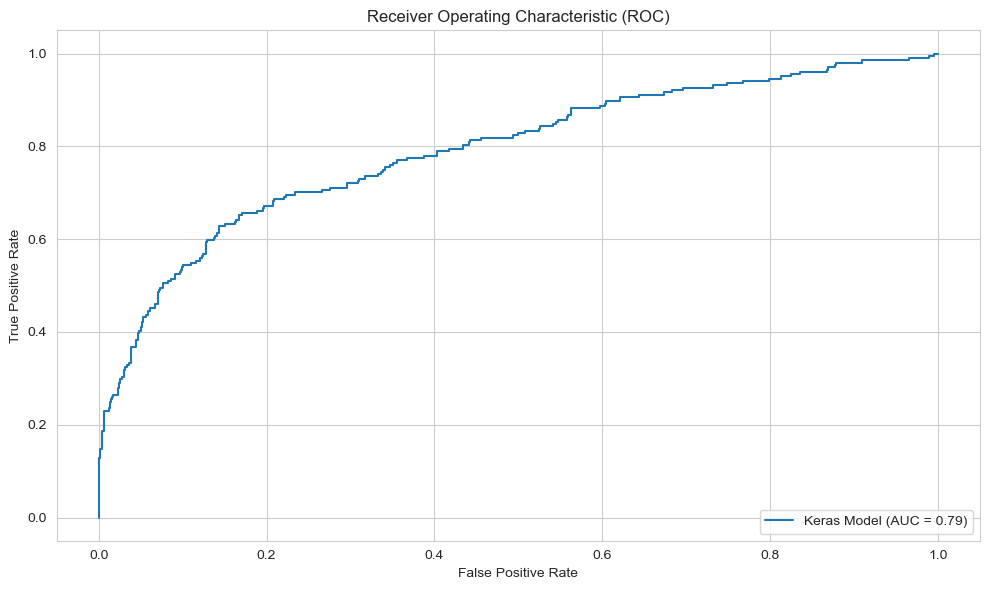

In [113]:
# Calculate ROC curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)

# Calculate ROC AUC
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Create and plot the ROC curve
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='Keras Model')
roc_display.plot()

plt.title('Receiver Operating Characteristic (ROC)')
plt.tight_layout()
plt.show()

## Implementation Different Methods to Develop The Model

- Implement the following methods on model creating with "class_weight" parameter
- Create and evaluate model for each method 

### Increase The Learning Rate and Observe The Results

In [114]:
# Create a model with increased learning rate
def create_model_high_lr(input_dim):
    model = Sequential([
        Dense(32, activation='relu', input_dim=input_dim),
        Dense(16, activation='relu'),
        Dense(8, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    optimizer = Adam(learning_rate=0.005)  # Increased learning rate
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [115]:
# Compute class weights
class_weights_array = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)

class_weights_dict = dict(enumerate(class_weights_array))
print("Class weights:", class_weights_dict)



Class weights: {0: 0.627906976744186, 1: 2.4545454545454546}


In [116]:
# Create the model instance
model_weighted_lr = create_model_high_lr(input_dim)

history = model_weighted_lr.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    class_weight=class_weights_dict,
    batch_size=32,
    epochs=500,
    verbose=1
)  

Epoch 1/500
254/254 [==============================] - 1s 3ms/step - loss: 0.6494 - accuracy: 0.6928 - val_loss: 0.7165 - val_accuracy: 0.4700
Epoch 2/500
254/254 [==============================] - 1s 2ms/step - loss: 0.5690 - accuracy: 0.7047 - val_loss: 0.4896 - val_accuracy: 0.7778
Epoch 3/500
254/254 [==============================] - 1s 2ms/step - loss: 0.5009 - accuracy: 0.7720 - val_loss: 0.5602 - val_accuracy: 0.7233
Epoch 4/500
254/254 [==============================] - 1s 2ms/step - loss: 0.4802 - accuracy: 0.7743 - val_loss: 0.4964 - val_accuracy: 0.7667
Epoch 5/500
254/254 [==============================] - 1s 2ms/step - loss: 0.4738 - accuracy: 0.7816 - val_loss: 0.4664 - val_accuracy: 0.7833
Epoch 6/500
254/254 [==============================] - 1s 2ms/step - loss: 0.4617 - accuracy: 0.7920 - val_loss: 0.4864 - val_accuracy: 0.7700
Epoch 7/500
254/254 [==============================] - 1s 2ms/step - loss: 0.4641 - accuracy: 0.7828 - val_loss: 0.5620 - val_accuracy: 0.7311

254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8227 - loss: 0.2955 - val_accuracy: 0.7589 - val_loss: 0.8384
Epoch 394/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8378 - loss: 0.2804 - val_accuracy: 0.7756 - val_loss: 0.9102
Epoch 395/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8203 - loss: 0.2960 - val_accuracy: 0.7656 - val_loss: 0.8884
Epoch 396/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8400 - loss: 0.2728 - val_accuracy: 0.7456 - val_loss: 0.8827
Epoch 397/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8186 - loss: 0.2971 - val_accuracy: 0.7578 - val_loss: 0.8355
Epoch 398/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8245 - loss: 0.3019 - val_accuracy: 0.7667 - val_loss: 0.8287
Epoch 399/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8362 - loss: 0.2799 - val_accuracy: 0.7567 - val_loss: 0.9042
Epoch 400/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8286 - loss: 0.2881 -

254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8449 - loss: 0.2693 - val_accuracy: 0.7544 - val_loss: 0.8444
Epoch 492/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8265 - loss: 0.2879 - val_accuracy: 0.7533 - val_loss: 0.9026
Epoch 493/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8252 - loss: 0.2875 - val_accuracy: 0.7744 - val_loss: 0.9546
Epoch 494/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8233 - loss: 0.3006 - val_accuracy: 0.7678 - val_loss: 0.8495
Epoch 495/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8361 - loss: 0.2770 - val_accuracy: 0.7678 - val_loss: 0.8794
Epoch 496/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8320 - loss: 0.2776 - val_accuracy: 0.7667 - val_loss: 0.9306
Epoch 497/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8377 - loss: 0.2813 - val_accuracy: 0.7522 - val_loss: 0.9714
Epoch 498/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8378 - loss: 0.2721 -

254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8285 - loss: 0.2761 - val_accuracy: 0.7500 - val_loss: 0.9694
Epoch 590/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8314 - loss: 0.2863 - val_accuracy: 0.7689 - val_loss: 1.0077
Epoch 591/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8272 - loss: 0.3045 - val_accuracy: 0.7744 - val_loss: 0.9315
Epoch 592/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8376 - loss: 0.2771 - val_accuracy: 0.7589 - val_loss: 0.9032
Epoch 593/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8423 - loss: 0.2635 - val_accuracy: 0.7711 - val_loss: 0.9245
Epoch 594/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8361 - loss: 0.2742 - val_accuracy: 0.7611 - val_loss: 0.9376
Epoch 595/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8391 - loss: 0.2726 - val_accuracy: 0.7689 - val_loss: 0.9708
Epoch 596/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8379 - loss: 0.2836 -

254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8312 - loss: 0.2753 - val_accuracy: 0.7633 - val_loss: 1.0064
Epoch 688/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8347 - loss: 0.2692 - val_accuracy: 0.7567 - val_loss: 1.0006
Epoch 689/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8350 - loss: 0.2761 - val_accuracy: 0.7711 - val_loss: 1.0032
Epoch 690/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8361 - loss: 0.2768 - val_accuracy: 0.7589 - val_loss: 0.9531
Epoch 691/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8401 - loss: 0.2588 - val_accuracy: 0.7600 - val_loss: 0.9481
Epoch 692/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8309 - loss: 0.2829 - val_accuracy: 0.7800 - val_loss: 0.9572
Epoch 693/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8443 - loss: 0.2659 - val_accuracy: 0.7567 - val_loss: 0.9832
Epoch 694/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8370 - loss: 0.2727 -

254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8356 - loss: 0.2797 - val_accuracy: 0.7578 - val_loss: 1.0969
Epoch 786/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8317 - loss: 0.2752 - val_accuracy: 0.7589 - val_loss: 1.0674
Epoch 787/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8347 - loss: 0.2698 - val_accuracy: 0.7689 - val_loss: 1.0465
Epoch 788/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8366 - loss: 0.2710 - val_accuracy: 0.7756 - val_loss: 1.0743
Epoch 789/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8560 - loss: 0.2430 - val_accuracy: 0.7611 - val_loss: 1.0511
Epoch 790/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8364 - loss: 0.2706 - val_accuracy: 0.7722 - val_loss: 1.0254
Epoch 791/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8400 - loss: 0.2618 - val_accuracy: 0.7633 - val_loss: 1.0233
Epoch 792/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8422 - loss: 0.2581 -

254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8532 - loss: 0.2484 - val_accuracy: 0.7533 - val_loss: 1.1042
Epoch 884/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8490 - loss: 0.2470 - val_accuracy: 0.7722 - val_loss: 1.1183
Epoch 885/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8442 - loss: 0.2609 - val_accuracy: 0.7600 - val_loss: 1.0339
Epoch 886/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8321 - loss: 0.2721 - val_accuracy: 0.7533 - val_loss: 1.1208
Epoch 887/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8492 - loss: 0.2557 - val_accuracy: 0.7578 - val_loss: 1.1080
Epoch 888/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8476 - loss: 0.2446 - val_accuracy: 0.7544 - val_loss: 1.1070
Epoch 889/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8374 - loss: 0.2606 - val_accuracy: 0.7656 - val_loss: 1.1120
Epoch 890/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8390 - loss: 0.2634 -

254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8446 - loss: 0.2517 - val_accuracy: 0.7511 - val_loss: 1.1092
Epoch 982/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8403 - loss: 0.2586 - val_accuracy: 0.7567 - val_loss: 1.0640
Epoch 983/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8449 - loss: 0.2660 - val_accuracy: 0.7756 - val_loss: 1.1473
Epoch 984/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8442 - loss: 0.2772 - val_accuracy: 0.7689 - val_loss: 1.1015
Epoch 985/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8498 - loss: 0.2491 - val_accuracy: 0.7656 - val_loss: 1.1833
Epoch 986/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8524 - loss: 0.2435 - val_accuracy: 0.7600 - val_loss: 1.2026
Epoch 987/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8596 - loss: 0.2451 - val_accuracy: 0.7511 - val_loss: 1.1688
Epoch 988/1000
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8478 - loss: 0.2526 -

In [117]:
model_weighted_lr.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 32)                384       
                                                                 
 dense_9 (Dense)             (None, 16)                528       
                                                                 
 dense_10 (Dense)            (None, 8)                 136       
                                                                 
 dense_11 (Dense)            (None, 1)                 9         
                                                                 
Total params: 1,057
Trainable params: 1,057
Non-trainable params: 0
_________________________________________________________________


In [118]:
loss_df = pd.DataFrame(history.history)
loss_df.head()

,loss,accuracy,val_loss,val_accuracy
0,0.65,0.69,0.72,0.47
1,0.57,0.70,0.49,0.78
2,0.50,0.77,0.56,0.72
3,0.48,0.77,0.50,0.77
4,0.47,0.78,0.47,0.78


In [119]:
model_weighted_lr.evaluate(X_test, y_test, verbose=0)

[0.6962535381317139, 0.7540000081062317]

In [120]:
loss, accuracy = model_weighted_lr.evaluate(X_test, y_test, verbose=0)

print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.6962535381317139
accuracy :  0.7540000081062317


In [121]:
# Adding loss and accuracy values
model_dict['model_weighted_lr_loss'] = loss
model_dict['model_weighted_lr_accuracy'] = accuracy
model_dict

{'model_loss': 0.519790768623352,
 'model_accuracy': 0.8169999718666077,
 'model_weighted_loss': 0.6227505207061768,
 'model_weighted_accuracy': 0.7900000214576721,
 'model_weighted_lr_loss': 0.6962535381317139,
 'model_weighted_lr_accuracy': 0.7540000081062317}

In [122]:
# Predict on the test set
y_pred = (model_weighted_lr.predict(X_test) > 0.5).astype("int32")

# Print confusion matrix
print(confusion_matrix(y_test, y_pred))

# Print classification report
print(classification_report(y_test, y_pred))

32/32 [==============================] - 0s 2ms/step
[[611 185]
 [ 61 143]]
              precision    recall  f1-score   support

           0       0.91      0.77      0.83       796
           1       0.44      0.70      0.54       204

    accuracy                           0.75      1000
   macro avg       0.67      0.73      0.69      1000
weighted avg       0.81      0.75      0.77      1000



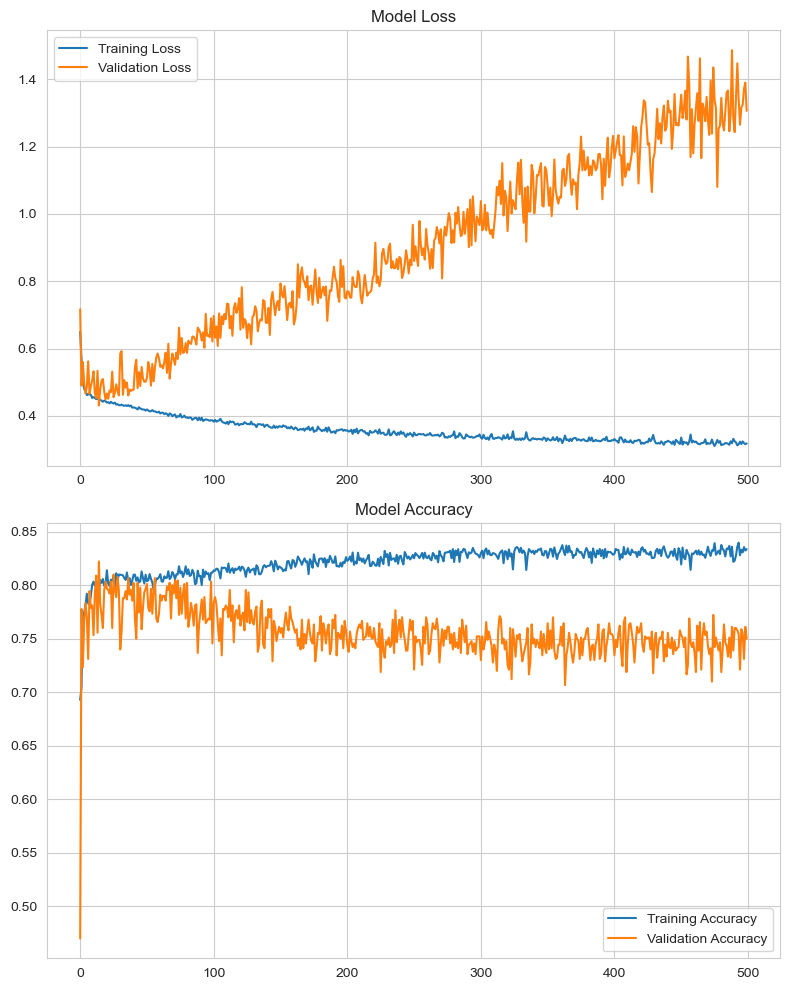

In [123]:
# Create subplots
fig, axes = plt.subplots(2, 1, figsize=(8, 10))

# Plot loss
axes[0].plot(loss_df["loss"], label="Training Loss")
axes[0].plot(loss_df["val_loss"], label="Validation Loss")
axes[0].set_title("Model Loss")
axes[0].legend()

# Plot accuracy
axes[1].plot(loss_df["accuracy"], label="Training Accuracy")
axes[1].plot(loss_df["val_accuracy"], label="Validation Accuracy")
axes[1].set_title("Model Accuracy")
axes[1].legend()

# Show the plots
plt.tight_layout()
plt.show()

32/32 [==============================] - 0s 1ms/step
ROC AUC: 0.8112


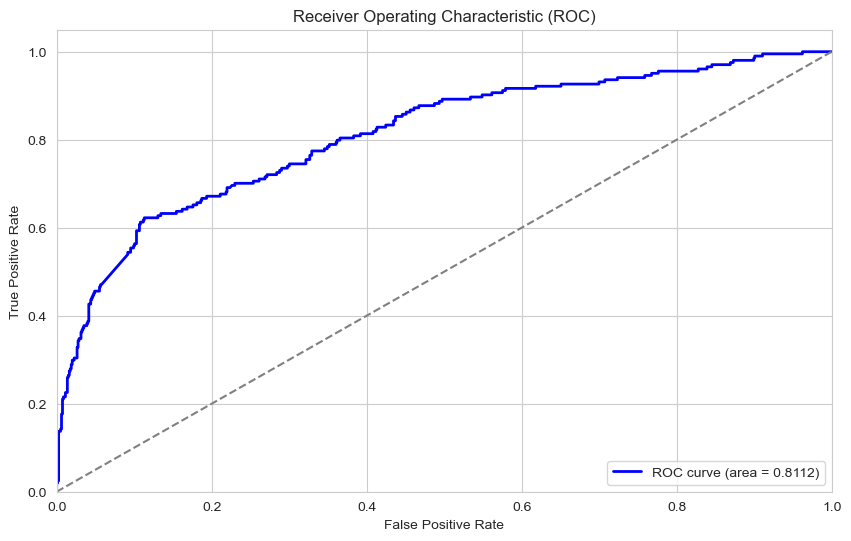

In [124]:
# Assuming you have your model, X_test, and y_test already prepared and trained
# Predict probabilities on the test set
y_pred_proba = model_weighted_lr.predict(X_test).flatten()

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate ROC AUC
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print ROC AUC
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

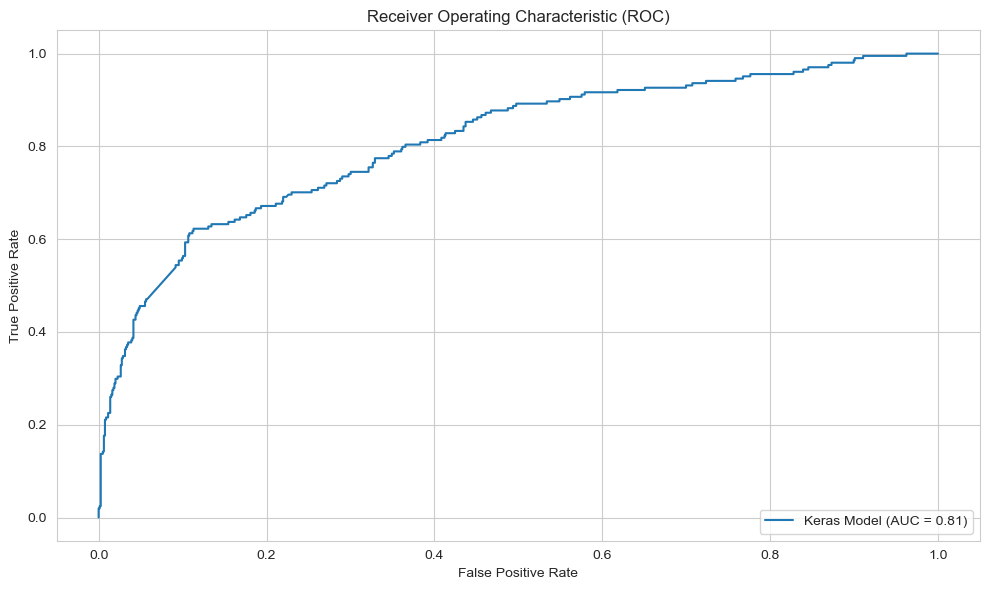

In [125]:
# Calculate ROC curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)

# Calculate ROC AUC
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Create and plot the ROC curve
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='Keras Model')
roc_display.plot()

plt.title('Receiver Operating Characteristic (ROC)')
plt.tight_layout()
plt.show()

### Add Dropout Layer

In [126]:
from tensorflow.keras.layers import Dropout

In [127]:
def create_model_high_lr_with_dropout(input_dim):
    model = Sequential([
        Dense(32, activation='relu', input_dim=input_dim),
        Dropout(0.5),
        Dense(16, activation='relu'),
        Dropout(0.5),
        Dense(8, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])
    optimizer = Adam(learning_rate=0.005)  # Increased learning rate
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [128]:
# Compute class weights
class_weights_array = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)

class_weights_dict = dict(enumerate(class_weights_array))
print("Class weights:", class_weights_dict)

Class weights: {0: 0.627906976744186, 1: 2.4545454545454546}


In [129]:
# Create the model instance
model_dr = create_model_high_lr_with_dropout(input_dim)


history = model_dr.fit(
    x=X_train,
    y=y_train,
    validation_data=(X_val, y_val), 
    class_weight=class_weights_dict,
    batch_size=16, 
    epochs=500, 
    verbose=1
)

Epoch 1/500
507/507 [==============================] - 2s 3ms/step - loss: 0.6832 - accuracy: 0.6405 - val_loss: 0.6449 - val_accuracy: 0.7389
Epoch 2/500
507/507 [==============================] - 1s 2ms/step - loss: 0.6669 - accuracy: 0.6752 - val_loss: 0.6584 - val_accuracy: 0.7078
Epoch 3/500
507/507 [==============================] - 1s 2ms/step - loss: 0.6432 - accuracy: 0.7048 - val_loss: 0.6026 - val_accuracy: 0.7200
Epoch 4/500
507/507 [==============================] - 1s 2ms/step - loss: 0.6266 - accuracy: 0.6915 - val_loss: 0.6065 - val_accuracy: 0.7356
Epoch 5/500
507/507 [==============================] - 1s 2ms/step - loss: 0.6239 - accuracy: 0.6840 - val_loss: 0.6976 - val_accuracy: 0.5511
Epoch 6/500
507/507 [==============================] - 1s 2ms/step - loss: 0.6038 - accuracy: 0.6716 - val_loss: 0.4904 - val_accuracy: 0.7700
Epoch 7/500
507/507 [==============================] - 1s 2ms/step - loss: 0.6052 - accuracy: 0.7026 - val_loss: 0.5513 - val_accuracy: 0.7422

Epoch 256/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7681 - loss: 0.5458 - val_Recall: 0.8087 - val_loss: 0.5050
Epoch 257/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7778 - loss: 0.5460 - val_Recall: 0.7486 - val_loss: 0.5223
Epoch 258/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7450 - loss: 0.5633 - val_Recall: 0.7104 - val_loss: 0.4792
Epoch 259/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7684 - loss: 0.5758 - val_Recall: 0.7268 - val_loss: 0.4816
Epoch 260/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7590 - loss: 0.5531 - val_Recall: 0.7213 - val_loss: 0.4677
Epoch 261/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7235 - loss: 0.5601 - val_Recall: 0.7923 - val_loss: 0.5174
Epoch 262/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7804 - loss: 0.5467 - val_Recall: 0.7596 - val_loss: 0.5024
Epoch 263/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7874 - loss: 0.5704 - val_Recall: 0.8197 - v

Epoch 307/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7700 - loss: 0.5606 - val_Recall: 0.7869 - val_loss: 0.4703
Epoch 308/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7815 - loss: 0.5455 - val_Recall: 0.7978 - val_loss: 0.5299
Epoch 309/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7797 - loss: 0.5535 - val_Recall: 0.8142 - val_loss: 0.4987
Epoch 310/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7853 - loss: 0.5393 - val_Recall: 0.7705 - val_loss: 0.4904
Epoch 311/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7464 - loss: 0.5554 - val_Recall: 0.6393 - val_loss: 0.4732
Epoch 312/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7306 - loss: 0.5529 - val_Recall: 0.6503 - val_loss: 0.5607
Epoch 313/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7390 - loss: 0.5556 - val_Recall: 0.7322 - val_loss: 0.4776
Epoch 314/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7381 - loss: 0.5781 - val_Recall: 0.7158 - v

Epoch 358/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7658 - loss: 0.5485 - val_Recall: 0.7978 - val_loss: 0.4964
Epoch 359/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7353 - loss: 0.5598 - val_Recall: 0.7978 - val_loss: 0.5112
Epoch 360/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7790 - loss: 0.5426 - val_Recall: 0.8033 - val_loss: 0.4952
Epoch 361/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7591 - loss: 0.5694 - val_Recall: 0.8361 - val_loss: 0.5312
Epoch 362/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7777 - loss: 0.5638 - val_Recall: 0.7923 - val_loss: 0.5719
Epoch 363/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - Recall: 0.7731 - loss: 0.5323 - val_Recall: 0.7213 - val_loss: 0.5632
Epoch 364/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7280 - loss: 0.5629 - val_Recall: 0.6667 - val_loss: 0.5060
Epoch 365/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7868 - loss: 0.5364 - val_Recall: 0.6503 - v

Epoch 409/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - Recall: 0.7550 - loss: 0.5428 - val_Recall: 0.7268 - val_loss: 0.4507
Epoch 410/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - Recall: 0.7589 - loss: 0.5691 - val_Recall: 0.7104 - val_loss: 0.5038
Epoch 411/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - Recall: 0.7200 - loss: 0.5373 - val_Recall: 0.7760 - val_loss: 0.5032
Epoch 412/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - Recall: 0.7144 - loss: 0.5602 - val_Recall: 0.7541 - val_loss: 0.5208
Epoch 413/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - Recall: 0.7612 - loss: 0.5539 - val_Recall: 0.7650 - val_loss: 0.5324
Epoch 414/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - Recall: 0.7063 - loss: 0.5593 - val_Recall: 0.6448 - val_loss: 0.5047
Epoch 415/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - Recall: 0.6898 - loss: 0.5464 - val_Recall: 0.7705 - val_loss: 0.5120
Epoch 416/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - Recall: 0.7470 - loss: 0.5590 - val_Recall: 0.7486 - v

Epoch 460/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - Recall: 0.7238 - loss: 0.5830 - val_Recall: 0.6721 - val_loss: 0.5783
Epoch 461/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - Recall: 0.7231 - loss: 0.5644 - val_Recall: 0.7268 - val_loss: 0.4855
Epoch 462/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - Recall: 0.7291 - loss: 0.5593 - val_Recall: 0.6721 - val_loss: 0.4928
Epoch 463/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7089 - loss: 0.5625 - val_Recall: 0.8087 - val_loss: 0.4954
Epoch 464/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7699 - loss: 0.5536 - val_Recall: 0.7705 - val_loss: 0.5535
Epoch 465/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7363 - loss: 0.5695 - val_Recall: 0.7923 - val_loss: 0.5245
Epoch 466/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7736 - loss: 0.5479 - val_Recall: 0.8033 - val_loss: 0.5251
Epoch 467/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Recall: 0.7650 - loss: 0.5701 - val_Recall: 0.7541 - v

In [130]:
loss_df = pd.DataFrame(history.history)
loss_df

,loss,accuracy,val_loss,val_accuracy
0,0.68,0.64,0.64,0.74
1,0.67,0.68,0.66,0.71
2,0.64,0.70,0.60,0.72
3,0.63,0.69,0.61,0.74
4,0.62,0.68,0.70,0.55
...,...,...,...,...
495,0.56,0.79,0.51,0.82
496,0.55,0.79,0.46,0.80
497,0.55,0.78,0.44,0.79
498,0.54,0.78,0.49,0.80


In [131]:
model_dr.evaluate(X_test, y_test, verbose=0)

[0.4565565586090088, 0.8180000185966492]

In [132]:
loss, accuracy = model_dr.evaluate(X_test, y_test, verbose=0)

print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.4565565586090088
accuracy :  0.8180000185966492


In [133]:
# Adding loss and accuracy values
model_dict['model_dr_loss'] = loss
model_dict['model_dr_accuracy'] = accuracy
model_dict

{'model_loss': 0.519790768623352,
 'model_accuracy': 0.8169999718666077,
 'model_weighted_loss': 0.6227505207061768,
 'model_weighted_accuracy': 0.7900000214576721,
 'model_weighted_lr_loss': 0.6962535381317139,
 'model_weighted_lr_accuracy': 0.7540000081062317,
 'model_dr_loss': 0.4565565586090088,
 'model_dr_accuracy': 0.8180000185966492}

In [134]:
# Predict on the test set
y_pred = (model_dr.predict(X_test) > 0.5).astype("int32")

# Print confusion matrix
print(confusion_matrix(y_test, y_pred))

# Print classification report
print(classification_report(y_test, y_pred))

32/32 [==============================] - 0s 937us/step
[[691 105]
 [ 77 127]]
              precision    recall  f1-score   support

           0       0.90      0.87      0.88       796
           1       0.55      0.62      0.58       204

    accuracy                           0.82      1000
   macro avg       0.72      0.75      0.73      1000
weighted avg       0.83      0.82      0.82      1000



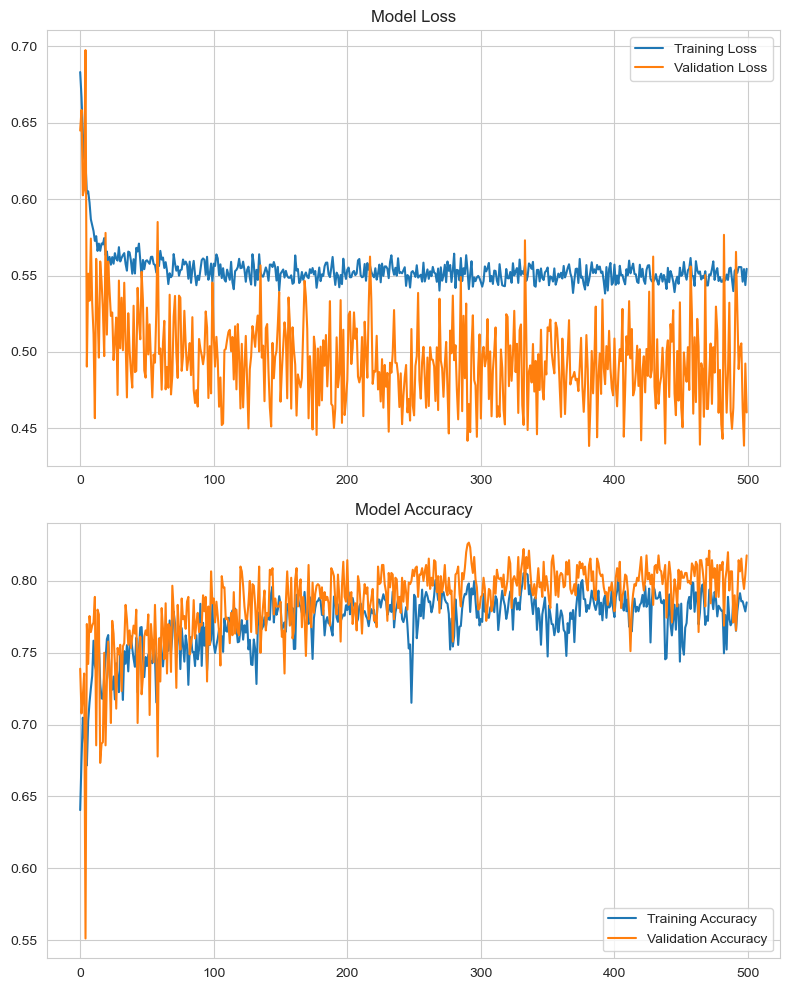

In [135]:
# Create subplots
fig, axes = plt.subplots(2, 1, figsize=(8, 10))

# Plot loss
axes[0].plot(loss_df["loss"], label="Training Loss")
axes[0].plot(loss_df["val_loss"], label="Validation Loss")
axes[0].set_title("Model Loss")
axes[0].legend()

# Plot accuracy
axes[1].plot(loss_df["accuracy"], label="Training Accuracy")
axes[1].plot(loss_df["val_accuracy"], label="Validation Accuracy")
axes[1].set_title("Model Accuracy")
axes[1].legend()

# Show the plots
plt.tight_layout()
plt.show()

32/32 [==============================] - 0s 1ms/step
ROC AUC: 0.8498


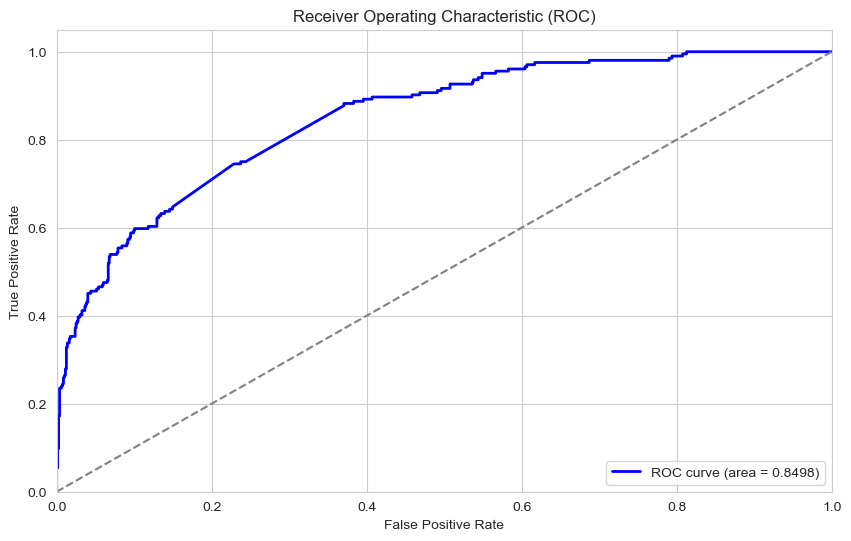

In [136]:
# Assuming you have your model, X_test, and y_test already prepared and trained
# Predict probabilities on the test set
y_pred_proba = model_dr.predict(X_test).flatten()

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate ROC AUC
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print ROC AUC
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

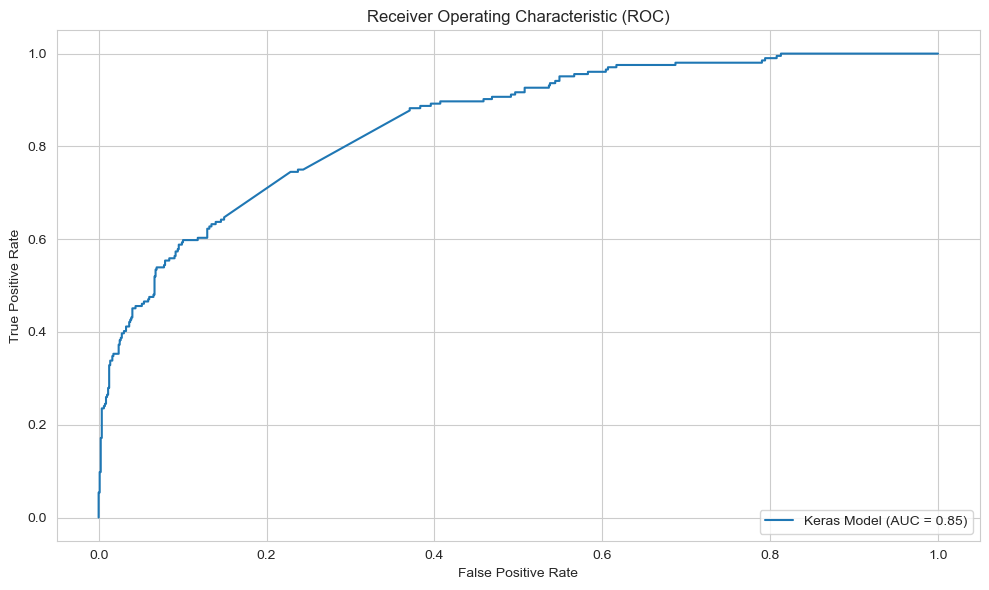

In [137]:
# Calculate ROC curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)

# Calculate ROC AUC
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Create and plot the ROC curve
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='Keras Model')
roc_display.plot()

plt.title('Receiver Operating Characteristic (ROC)')
plt.tight_layout()
plt.show()

### Add Early Stop

#### Monitor the "val_loss" as metric

In [138]:
from tensorflow.keras.callbacks import EarlyStopping

In [139]:
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=15, restore_best_weights=True
)

In [140]:
model_es = Sequential()

model_es.add(Dense(36, activation="relu", input_dim=X_train.shape[1]))
model_es.add(Dropout(0.5))

model_es.add(Dense(18, activation="relu"))
model_es.add(Dropout(0.5))

model_es.add(Dense(9, activation="relu"))
model_es.add(Dropout(0.5))

model_es.add(Dense(1, activation="sigmoid"))

opt = Adam(learning_rate=0.005)
model_es.compile(optimizer=opt, loss="binary_crossentropy", metrics=["accuracy"])

In [141]:
# Compute class weights
class_weights_array = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)

class_weights_dict = dict(enumerate(class_weights_array))
print("Class weights:", class_weights_dict)

Class weights: {0: 0.627906976744186, 1: 2.4545454545454546}


In [142]:
history = model_es.fit(
    x=X_train,
    y=y_train,
    validation_data=(X_val, y_val), 
    class_weight=class_weights_dict,
    batch_size=16, 
    epochs=500, 
    callbacks=[early_stop]
)

Epoch 1/500
507/507 [==============================] - 2s 3ms/step - loss: 0.6862 - accuracy: 0.5237 - val_loss: 0.6439 - val_accuracy: 0.7456
Epoch 2/500
507/507 [==============================] - 1s 2ms/step - loss: 0.6658 - accuracy: 0.7181 - val_loss: 0.6091 - val_accuracy: 0.7944
Epoch 3/500
507/507 [==============================] - 1s 2ms/step - loss: 0.6470 - accuracy: 0.7348 - val_loss: 0.6484 - val_accuracy: 0.7422
Epoch 4/500
507/507 [==============================] - 1s 2ms/step - loss: 0.6403 - accuracy: 0.7506 - val_loss: 0.5958 - val_accuracy: 0.7856
Epoch 5/500
507/507 [==============================] - 1s 3ms/step - loss: 0.6194 - accuracy: 0.7528 - val_loss: 0.5661 - val_accuracy: 0.8067
Epoch 6/500
507/507 [==============================] - 1s 2ms/step - loss: 0.6020 - accuracy: 0.7814 - val_loss: 0.5436 - val_accuracy: 0.7911
Epoch 7/500
507/507 [==============================] - 1s 2ms/step - loss: 0.5959 - accuracy: 0.7641 - val_loss: 0.5284 - val_accuracy: 0.7867

In [144]:
loss_df = pd.DataFrame(history.history)
loss_df
# Create subplots

,loss,accuracy,val_loss,val_accuracy
0,0.69,0.52,0.64,0.75
1,0.67,0.72,0.61,0.79
2,0.65,0.73,0.65,0.74
3,0.64,0.75,0.60,0.79
4,0.62,0.75,0.57,0.81
...,...,...,...,...
20,0.55,0.76,0.48,0.76
21,0.55,0.79,0.53,0.75
22,0.55,0.78,0.47,0.79
23,0.55,0.78,0.49,0.78


In [145]:
# Evaluate the model on the test data
loss, accuracy = model_es.evaluate(X_test, y_test, verbose=0)
print("Loss: ", loss)
print("Accuracy: ", accuracy)


Loss:  0.4466857314109802
Accuracy:  0.8069999814033508


In [146]:
# Adding loss and accuracy values
model_dict['model_es_loss'] = loss
model_dict['model_es_accuracy'] = accuracy
model_dict

{'model_loss': 0.519790768623352,
 'model_accuracy': 0.8169999718666077,
 'model_weighted_loss': 0.6227505207061768,
 'model_weighted_accuracy': 0.7900000214576721,
 'model_weighted_lr_loss': 0.6962535381317139,
 'model_weighted_lr_accuracy': 0.7540000081062317,
 'model_dr_loss': 0.4565565586090088,
 'model_dr_accuracy': 0.8180000185966492,
 'model_es_loss': 0.4466857314109802,
 'model_es_accuracy': 0.8069999814033508}

In [147]:
y_pred = model_es.predict(X_test) > 0.5
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

32/32 [==============================] - 0s 986us/step
[[682 114]
 [ 79 125]]
              precision    recall  f1-score   support

           0       0.90      0.86      0.88       796
           1       0.52      0.61      0.56       204

    accuracy                           0.81      1000
   macro avg       0.71      0.73      0.72      1000
weighted avg       0.82      0.81      0.81      1000



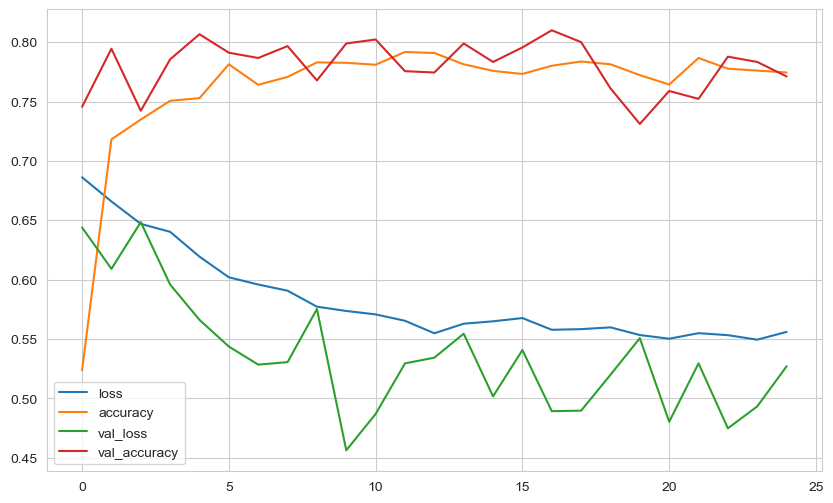

In [148]:
loss_df.plot()
plt.show()

32/32 [==============================] - 0s 1ms/step
model_es Average Precision (AP): 0.6431860460793252
model_es Precision: 0.5230125523012552
model_es Recall: 0.6127450980392157


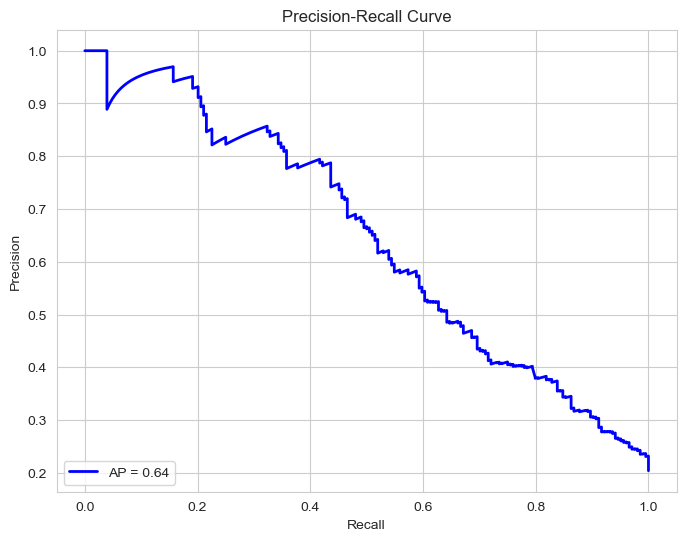

In [149]:

from sklearn.metrics import precision_score, recall_score, average_precision_score,precision_recall_curve


y_pred_proba = model_es.predict(X_test)
y_pred = (y_pred_proba > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate metrics
model_es_AP = average_precision_score(y_test, y_pred_proba)  # Use probabilities for AP score
model_es_precision = precision_score(y_test, y_pred)
model_es_recall = recall_score(y_test, y_pred)

print("model_es Average Precision (AP):", model_es_AP)
print("model_es Precision:", model_es_precision)
print("model_es Recall:", model_es_recall)

# Generate precision-recall curve
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)

# Plot precision-recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='blue', lw=2, label=f'AP = {model_es_AP:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()

#### Monitor the "val_recall" as metric

In [150]:
early_stop = EarlyStopping(
    monitor="val_recall", mode="max", verbose=1, patience=15, restore_best_weights=True
)

In [151]:
model_es2 = Sequential()

model_es2.add(Dense(36, activation="relu", input_dim=X_train.shape[1]))
model_es2.add(Dropout(0.5))

model_es2.add(Dense(18, activation="relu"))
model_es2.add(Dropout(0.5))

model_es2.add(Dense(9, activation="relu"))
model_es2.add(Dropout(0.5))

model_es2.add(Dense(1, activation="sigmoid"))

opt = Adam(learning_rate=0.005)
model_es2.compile(optimizer=opt, loss="binary_crossentropy", metrics=["Recall"])

In [152]:
history = model_es2.fit(
    x=X_train,
    y=y_train,
    validation_data=(X_val, y_val), 
    class_weight=class_weights_dict,
    batch_size=16, 
    epochs=500, 
    callbacks=[early_stop]
)

Epoch 1/500
507/507 [==============================] - 2s 3ms/step - loss: 0.6885 - recall: 0.6297 - val_loss: 0.7210 - val_recall: 0.7814
Epoch 2/500
507/507 [==============================] - 1s 2ms/step - loss: 0.6594 - recall: 0.5309 - val_loss: 0.5858 - val_recall: 0.3279
Epoch 3/500
507/507 [==============================] - 1s 3ms/step - loss: 0.6377 - recall: 0.5352 - val_loss: 0.6231 - val_recall: 0.7432
Epoch 4/500
507/507 [==============================] - 1s 2ms/step - loss: 0.6135 - recall: 0.5855 - val_loss: 0.5838 - val_recall: 0.6776
Epoch 5/500
507/507 [==============================] - 1s 2ms/step - loss: 0.5978 - recall: 0.6030 - val_loss: 0.4851 - val_recall: 0.5847
Epoch 6/500
507/507 [==============================] - 1s 2ms/step - loss: 0.5894 - recall: 0.6127 - val_loss: 0.5426 - val_recall: 0.6995
Epoch 7/500
507/507 [==============================] - 1s 2ms/step - loss: 0.5745 - recall: 0.6321 - val_loss: 0.5251 - val_recall: 0.7049
Epoch 8/500
507/507 [======

507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - Recall: 0.7454 - loss: 0.5546 - val_Recall: 0.6503 - val_loss: 0.5303
Epoch 306/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - Recall: 0.5818 - loss: 0.5748 - val_Recall: 0.6721 - val_loss: 0.5077
Epoch 307/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - Recall: 0.5744 - loss: 0.5725 - val_Recall: 0.6284 - val_loss: 0.5132
Epoch 308/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - Recall: 0.6089 - loss: 0.5678 - val_Recall: 0.6831 - val_loss: 0.4921
Epoch 309/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - Recall: 0.6053 - loss: 0.5650 - val_Recall: 0.7541 - val_loss: 0.4898
Epoch 310/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - Recall: 0.7010 - loss: 0.5844 - val_Recall: 0.7760 - val_loss: 0.4778
Epoch 311/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - Recall: 0.6627 - loss: 0.5657 - val_Recall: 0.8197 - val_loss: 0.5596
Epoch 312/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - Recall: 0.6297 - loss: 0.5637 - val_Recall: 0.5847 -

507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - Recall: 0.5242 - loss: 0.5698 - val_Recall: 0.5902 - val_loss: 0.5477
Epoch 406/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - Recall: 0.5458 - loss: 0.5527 - val_Recall: 0.6667 - val_loss: 0.5024
Epoch 407/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - Recall: 0.7054 - loss: 0.5763 - val_Recall: 0.7104 - val_loss: 0.5001
Epoch 408/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - Recall: 0.7264 - loss: 0.5523 - val_Recall: 0.8087 - val_loss: 0.5709
Epoch 409/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - Recall: 0.7371 - loss: 0.5627 - val_Recall: 0.5683 - val_loss: 0.5053
Epoch 410/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - Recall: 0.5366 - loss: 0.5563 - val_Recall: 0.6120 - val_loss: 0.4890
Epoch 411/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - Recall: 0.6008 - loss: 0.5601 - val_Recall: 0.7322 - val_loss: 0.5114
Epoch 412/500
507/507 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - Recall: 0.7255 - loss: 0.5588 - val_Recall: 0.6776 -

In [153]:
loss_df = pd.DataFrame(history.history)
loss_df
# Create subplots

,loss,recall,val_loss,val_recall
0,0.69,0.63,0.72,0.78
1,0.66,0.53,0.59,0.33
2,0.64,0.54,0.62,0.74
3,0.61,0.59,0.58,0.68
4,0.60,0.60,0.49,0.58
5,0.59,0.61,0.54,0.70
6,0.57,0.63,0.53,0.70
7,0.57,0.63,0.50,0.60
8,0.57,0.62,0.53,0.68
9,0.57,0.64,0.50,0.67


In [154]:
# Evaluate the model on the test data
loss, accuracy = model_es2.evaluate(X_test, y_test, verbose=0)
print("Loss: ", loss)
print("Accuracy: ", accuracy)


Loss:  0.7279702425003052
Accuracy:  0.7401960492134094


In [155]:
# Adding loss and accuracy values
model_dict['model_es2_loss'] = loss
model_dict['model_es2_accuracy'] = accuracy
model_dict

{'model_loss': 0.519790768623352,
 'model_accuracy': 0.8169999718666077,
 'model_weighted_loss': 0.6227505207061768,
 'model_weighted_accuracy': 0.7900000214576721,
 'model_weighted_lr_loss': 0.6962535381317139,
 'model_weighted_lr_accuracy': 0.7540000081062317,
 'model_dr_loss': 0.4565565586090088,
 'model_dr_accuracy': 0.8180000185966492,
 'model_es_loss': 0.4466857314109802,
 'model_es_accuracy': 0.8069999814033508,
 'model_es2_loss': 0.7279702425003052,
 'model_es2_accuracy': 0.7401960492134094}

In [156]:
y_pred = model_es2.predict(X_test) > 0.5
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

32/32 [==============================] - 0s 890us/step
[[401 395]
 [ 53 151]]
              precision    recall  f1-score   support

           0       0.88      0.50      0.64       796
           1       0.28      0.74      0.40       204

    accuracy                           0.55      1000
   macro avg       0.58      0.62      0.52      1000
weighted avg       0.76      0.55      0.59      1000



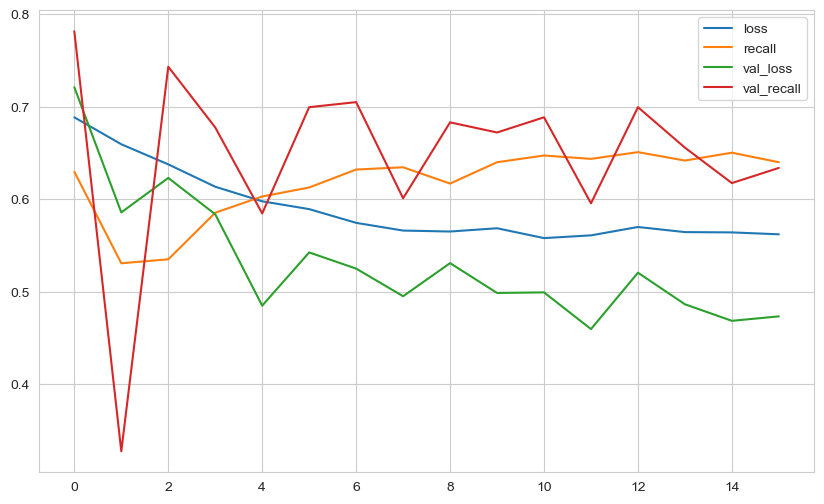

In [157]:
loss_df.plot()
plt.show()

32/32 [==============================] - 0s 986us/step
model_es2 Average Precision (AP): 0.3642036302394201
model_es2 Precision: 0.2765567765567766
model_es2 Recall: 0.7401960784313726


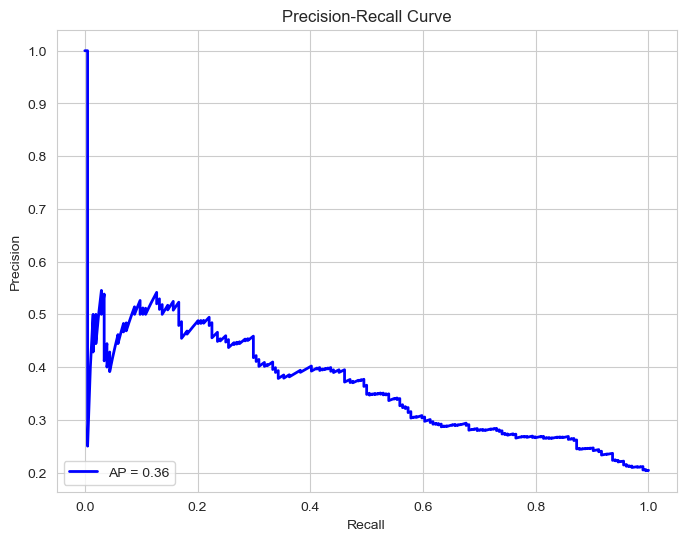

In [158]:

from sklearn.metrics import precision_score, recall_score, average_precision_score


y_pred_proba = model_es2.predict(X_test)
y_pred = (y_pred_proba > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate metrics
model_es2_AP = average_precision_score(y_test, y_pred_proba)  # Use probabilities for AP score
model_es2_precision = precision_score(y_test, y_pred)
model_es2_recall = recall_score(y_test, y_pred)

print("model_es2 Average Precision (AP):", model_es2_AP)
print("model_es2 Precision:", model_es2_precision)
print("model_es2 Recall:", model_es2_recall)

# Generate precision-recall curve
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)

# Plot precision-recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='blue', lw=2, label=f'AP = {model_es2_AP:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()

## Optuna

### Evaluate The Model

- Plot the model history to observe the changing of metrics
- Make prediction to see "confusion matrix" and "classification report"
- Check ROC (Receiver Operating Curve) and AUC (Area Under Curve) for the model

In [166]:
from tensorflow.keras.optimizers import Adam, Adadelta, RMSprop, Nadam
import optuna

In [167]:
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=15, restore_best_weights=True
)

In [168]:
trial_metric = "Recall"
batch_size = 64


def create_model(trial): # the part where the metric ranges in the compile part of the model are determined and the model is built
    # Some hyperparameters we want to optimize # 
    n_units1 = trial.suggest_int("n_units1", 2, 128) # number of neurons
    n_units2 = trial.suggest_int("n_units2", 2, 128) 
    n_units3 = trial.suggest_int("n_units3", 2, 128)
    n_units4 = trial.suggest_int("n_units4", 2, 128)
    optimizer = trial.suggest_categorical("optimizer", [Adam, Adadelta, RMSprop, Nadam])
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1.3e-1)

    model = Sequential()
    model.add(Dense(n_units1, input_dim=X_train.shape[1], activation="relu"))
    model.add(Dense(n_units2, activation="relu")) # hidden layer
    model.add(Dense(n_units3, activation="relu"))
    model.add(Dense(n_units4, activation="relu"))
    model.add(Dense(1, activation="sigmoid")) # output.
    model.compile(
        loss="binary_crossentropy",
        optimizer=optimizer(learning_rate=learning_rate),
        metrics=[trial_metric],
    )
    return model


def objective(trial): # contains fit
    model = create_model(trial) # called the created model.
    w0 = trial.suggest_loguniform("w0", 0.01, 5) # class_weight
    w1 = trial.suggest_loguniform("w1", 0.01, 5)
    model.fit(
        X_train,
        y_train,
        validation_data=(X_val, y_val),
        batch_size=batch_size,
        epochs=100,
        callbacks=[early_stop],
        class_weight={0: w0, 1: w1},
        verbose=0,
    )
    score = model.evaluate(X_test, y_test, verbose=0)[1]
    return score

In [169]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=10)
study.best_params

[I 2024-07-22 16:08:50,370] A new study created in memory with name: no-name-d8c59d69-1a44-4f8b-9140-5a9efc419de6


Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping


[I 2024-07-22 16:08:56,324] Trial 0 finished with value: 1.0 and parameters: {'n_units1': 8, 'n_units2': 19, 'n_units3': 45, 'n_units4': 13, 'optimizer': <class 'keras.optimizers.optimizer_v2.nadam.Nadam'>, 'learning_rate': 0.00015921306548396063, 'w0': 0.011257725359595003, 'w1': 1.404611992196164}. Best is trial 0 with value: 1.0.


Restoring model weights from the end of the best epoch: 7.
Epoch 22: early stopping


[I 2024-07-22 16:09:06,106] Trial 1 finished with value: 0.14215686917304993 and parameters: {'n_units1': 128, 'n_units2': 118, 'n_units3': 124, 'n_units4': 59, 'optimizer': <class 'keras.optimizers.optimizer_v2.nadam.Nadam'>, 'learning_rate': 0.001043773828410741, 'w0': 0.23182866585960507, 'w1': 0.01856265180083945}. Best is trial 0 with value: 1.0.


Restoring model weights from the end of the best epoch: 8.
Epoch 23: early stopping


[I 2024-07-22 16:09:16,346] Trial 2 finished with value: 0.3970588147640228 and parameters: {'n_units1': 102, 'n_units2': 76, 'n_units3': 32, 'n_units4': 103, 'optimizer': <class 'keras.optimizers.optimizer_v2.nadam.Nadam'>, 'learning_rate': 0.013071910362428302, 'w0': 0.33293656046622894, 'w1': 1.0597941125920822}. Best is trial 0 with value: 1.0.


Restoring model weights from the end of the best epoch: 23.
Epoch 38: early stopping


[I 2024-07-22 16:09:30,596] Trial 3 finished with value: 0.0 and parameters: {'n_units1': 21, 'n_units2': 45, 'n_units3': 45, 'n_units4': 64, 'optimizer': <class 'keras.optimizers.optimizer_v2.adadelta.Adadelta'>, 'learning_rate': 0.002740534753328659, 'w0': 0.5015639452379894, 'w1': 0.02213574813479171}. Best is trial 0 with value: 1.0.


Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping


[I 2024-07-22 16:09:38,030] Trial 4 finished with value: 1.0 and parameters: {'n_units1': 99, 'n_units2': 124, 'n_units3': 101, 'n_units4': 67, 'optimizer': <class 'keras.optimizers.optimizer_v2.adam.Adam'>, 'learning_rate': 4.2851314682801315e-05, 'w0': 0.023805188450630923, 'w1': 0.573139744124049}. Best is trial 0 with value: 1.0.


Restoring model weights from the end of the best epoch: 25.
Epoch 40: early stopping


[I 2024-07-22 16:09:53,184] Trial 5 finished with value: 0.4852941036224365 and parameters: {'n_units1': 58, 'n_units2': 18, 'n_units3': 62, 'n_units4': 68, 'optimizer': <class 'keras.optimizers.optimizer_v2.nadam.Nadam'>, 'learning_rate': 0.0008135065313889779, 'w0': 0.40315813031968933, 'w1': 0.9406009938743343}. Best is trial 0 with value: 1.0.


Restoring model weights from the end of the best epoch: 20.
Epoch 35: early stopping


[I 2024-07-22 16:10:06,230] Trial 6 finished with value: 0.3480392098426819 and parameters: {'n_units1': 118, 'n_units2': 48, 'n_units3': 106, 'n_units4': 29, 'optimizer': <class 'keras.optimizers.optimizer_v2.rmsprop.RMSprop'>, 'learning_rate': 0.0005106061776384699, 'w0': 0.5359586342513196, 'w1': 0.3823960185251467}. Best is trial 0 with value: 1.0.


Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping


[I 2024-07-22 16:10:12,167] Trial 7 finished with value: 0.9656862616539001 and parameters: {'n_units1': 19, 'n_units2': 15, 'n_units3': 111, 'n_units4': 64, 'optimizer': <class 'keras.optimizers.optimizer_v2.adadelta.Adadelta'>, 'learning_rate': 1.4620052431023772e-05, 'w0': 0.011766430475537075, 'w1': 2.3480104971876403}. Best is trial 0 with value: 1.0.


Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping


[I 2024-07-22 16:10:18,258] Trial 8 finished with value: 0.936274528503418 and parameters: {'n_units1': 101, 'n_units2': 61, 'n_units3': 35, 'n_units4': 33, 'optimizer': <class 'keras.optimizers.optimizer_v2.adadelta.Adadelta'>, 'learning_rate': 0.0014699036480564477, 'w0': 0.017756727416773796, 'w1': 0.15272754343673375}. Best is trial 0 with value: 1.0.


Restoring model weights from the end of the best epoch: 30.
Epoch 45: early stopping


[I 2024-07-22 16:10:33,971] Trial 9 finished with value: 0.6323529481887817 and parameters: {'n_units1': 5, 'n_units2': 31, 'n_units3': 42, 'n_units4': 31, 'optimizer': <class 'keras.optimizers.optimizer_v2.nadam.Nadam'>, 'learning_rate': 0.0045513670383971055, 'w0': 0.010834230364737473, 'w1': 0.038502041640208456}. Best is trial 0 with value: 1.0.


{'n_units1': 8,
 'n_units2': 19,
 'n_units3': 45,
 'n_units4': 13,
 'optimizer': keras.optimizers.optimizer_v2.nadam.Nadam,
 'learning_rate': 0.00015921306548396063,
 'w0': 0.011257725359595003,
 'w1': 1.404611992196164}

In [170]:
unit1, unit2, unit3,unit4, optimizer, lr, w0, w1 = (
    study.best_params["n_units1"],
    study.best_params["n_units2"],
    study.best_params["n_units3"],
    study.best_params["n_units4"],
    study.best_params["optimizer"],
    study.best_params["learning_rate"],
    study.best_params["w0"],
    study.best_params["w1"],
)

model_op = Sequential()

model_op.add(Dense(unit1, activation="relu", input_dim=X_train.shape[1])) 
model_op.add(Dense(unit2, activation="relu"))
model_op.add(Dense(unit3, activation="relu"))
model_op.add(Dense(unit4, activation="relu"))
model_op.add(Dense(1, activation="sigmoid"))

opt = optimizer(learning_rate=lr)
model_op.compile(optimizer=opt, loss="binary_crossentropy", metrics=["Recall"])

model_op.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    batch_size=64,
    epochs=500,
    callbacks=[early_stop],
    class_weight={0: w0, 1: w1},
    verbose=1,
)

#loss has binary_crossentropy. Because we are working in binary.
# If there was multiclass, we would be working with categorical_crossentropy.

Epoch 1/500
127/127 [==============================] - 1s 4ms/step - loss: 0.1632 - recall: 0.9679 - val_loss: 0.9805 - val_recall: 1.0000
Epoch 2/500
127/127 [==============================] - 0s 3ms/step - loss: 0.0904 - recall: 1.0000 - val_loss: 1.6611 - val_recall: 1.0000
Epoch 3/500
127/127 [==============================] - 0s 3ms/step - loss: 0.0528 - recall: 1.0000 - val_loss: 2.3724 - val_recall: 1.0000
Epoch 4/500
127/127 [==============================] - 0s 3ms/step - loss: 0.0445 - recall: 1.0000 - val_loss: 2.6642 - val_recall: 1.0000
Epoch 5/500
127/127 [==============================] - 0s 3ms/step - loss: 0.0424 - recall: 1.0000 - val_loss: 2.7417 - val_recall: 1.0000
Epoch 6/500
127/127 [==============================] - 0s 3ms/step - loss: 0.0413 - recall: 1.0000 - val_loss: 2.7337 - val_recall: 1.0000
Epoch 7/500
127/127 [==============================] - 0s 3ms/step - loss: 0.0405 - recall: 1.0000 - val_loss: 2.6844 - val_recall: 1.0000
Epoch 8/500
127/127 [======

In [171]:
# pd.DataFrame(model_op.history.history).plot()
# plt.show()
y_pred = (model_op.predict(X_test) > 0.5).astype("int32")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

32/32 [==============================] - 0s 986us/step
[[  0 796]
 [  0 204]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       796
           1       0.20      1.00      0.34       204

    accuracy                           0.20      1000
   macro avg       0.10      0.50      0.17      1000
weighted avg       0.04      0.20      0.07      1000



32/32 [==============================] - 0s 986us/step
model_op Average Precision (AP): 0.21072214007447382
model_op Precision: 0.204
model_op Recall: 1.0


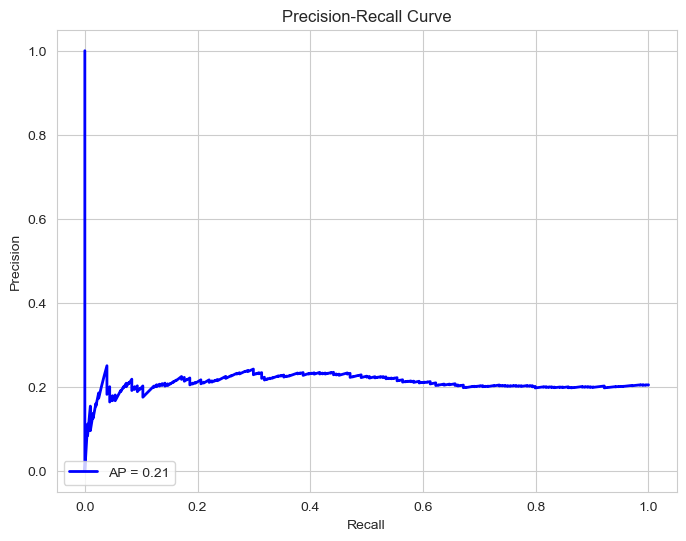

In [172]:
from sklearn.metrics import precision_score, recall_score, average_precision_score


y_pred_proba = model_op.predict(X_test)
y_pred = (y_pred_proba > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate metrics
model_op_AP = average_precision_score(y_test, y_pred_proba)  # Use probabilities for AP score
model_op_precision = precision_score(y_test, y_pred)
model_op_recall = recall_score(y_test, y_pred)

print("model_op Average Precision (AP):", model_op_AP)
print("model_op Precision:", model_op_precision)
print("model_op Recall:", model_op_recall)

# Generate precision-recall curve
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)

# Plot precision-recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='blue', lw=2, label=f'AP = {model_op_AP:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()

In [173]:
roc_auc_score(y_test, y_pred_proba)

0.5118546162183466

In [174]:
import pickle

pickle.dump(scaler, open("scaler_cancer", "wb"))

In [175]:
model_dict

{'model_loss': 0.519790768623352,
 'model_accuracy': 0.8169999718666077,
 'model_weighted_loss': 0.6227505207061768,
 'model_weighted_accuracy': 0.7900000214576721,
 'model_weighted_lr_loss': 0.6962535381317139,
 'model_weighted_lr_accuracy': 0.7540000081062317,
 'model_dr_loss': 0.4565565586090088,
 'model_dr_accuracy': 0.8180000185966492,
 'model_es_loss': 0.4466857314109802,
 'model_es_accuracy': 0.8069999814033508,
 'model_es2_loss': 0.7279702425003052,
 'model_es2_accuracy': 0.7401960492134094}

## Model Selection

In [181]:
y_pred = model_es.predict(X_test) > 0.5
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

32/32 [==============================] - 0s 1ms/step
[[682 114]
 [ 79 125]]
              precision    recall  f1-score   support

           0       0.90      0.86      0.88       796
           1       0.52      0.61      0.56       204

    accuracy                           0.81      1000
   macro avg       0.71      0.73      0.72      1000
weighted avg       0.82      0.81      0.81      1000



In [182]:
y_pred = model_es2.predict(X_test) > 0.5
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

32/32 [==============================] - 0s 1ms/step
[[401 395]
 [ 53 151]]
              precision    recall  f1-score   support

           0       0.88      0.50      0.64       796
           1       0.28      0.74      0.40       204

    accuracy                           0.55      1000
   macro avg       0.58      0.62      0.52      1000
weighted avg       0.76      0.55      0.59      1000



In [183]:
y_pred = model_weighted_lr.predict(X_test) > 0.5
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

32/32 [==============================] - 0s 986us/step
[[611 185]
 [ 61 143]]
              precision    recall  f1-score   support

           0       0.91      0.77      0.83       796
           1       0.44      0.70      0.54       204

    accuracy                           0.75      1000
   macro avg       0.67      0.73      0.69      1000
weighted avg       0.81      0.75      0.77      1000



In [184]:
y_pred = model_op.predict(X_test) > 0.5
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

32/32 [==============================] - 0s 1ms/step
[[  0 796]
 [  0 204]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       796
           1       0.20      1.00      0.34       204

    accuracy                           0.20      1000
   macro avg       0.10      0.50      0.17      1000
weighted avg       0.04      0.20      0.07      1000



In [185]:
y_pred = model_weighted.predict(X_test) > 0.5
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

32/32 [==============================] - 0s 971us/step
[[656 140]
 [ 70 134]]
              precision    recall  f1-score   support

           0       0.90      0.82      0.86       796
           1       0.49      0.66      0.56       204

    accuracy                           0.79      1000
   macro avg       0.70      0.74      0.71      1000
weighted avg       0.82      0.79      0.80      1000



In [180]:
y_pred = model_dr.predict(X_test) > 0.5
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
##I choose this model 

32/32 [==============================] - 0s 1ms/step
[[691 105]
 [ 77 127]]
              precision    recall  f1-score   support

           0       0.90      0.87      0.88       796
           1       0.55      0.62      0.58       204

    accuracy                           0.82      1000
   macro avg       0.72      0.75      0.73      1000
weighted avg       0.83      0.82      0.82      1000



## Final Model

In [317]:
df

,creditscore,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,geography_Germany,geography_Spain,gender_Male,churn
0,619,42,2,0.00,1,1,1,"101,348.88",0,0,0,1
1,608,41,1,"83,807.86",1,0,1,"112,542.58",0,1,0,0
2,502,42,8,"159,660.80",3,1,0,"113,931.57",0,0,0,1
3,699,39,1,0.00,2,0,0,"93,826.63",0,0,0,0
4,850,43,2,"125,510.82",1,1,1,"79,084.10",0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,771,39,5,0.00,2,1,0,"96,270.64",0,0,1,0
9996,516,35,10,"57,369.61",1,1,1,"101,699.77",0,0,1,0
9997,709,36,7,0.00,1,0,1,"42,085.58",0,0,0,1
9998,772,42,3,"75,075.31",2,1,0,"92,888.52",1,0,1,1


In [186]:
X = df.drop("churn", axis=1)
y = df["churn"]

In [187]:


# Example seed value
seed = 42

# Assuming X and y are already defined
# X: Input features
# y: Target variable

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.1,
    stratify=y,  
    random_state=seed
)

# Further split the training set into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train,
    test_size=0.1,
    stratify=y_train,
    random_state=seed
)

# Verify the splits
print(f"Training set size: {X_train.shape}")
print(f"Validation set size: {X_val.shape}")
print(f"Testing set size: {X_test.shape}")

Training set size: (8100, 11)
Validation set size: (900, 11)
Testing set size: (1000, 11)


In [188]:
scaler = MinMaxScaler()

In [189]:
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

In [190]:

# Define the number of features (input dimension)
input_dim = X_train.shape[1]

In [191]:
X_train.shape[1]

11

In [192]:
y_train = y_train.astype(int)

In [193]:

# Verify unique class labels in y_train
unique_classes = np.unique(y_train)
print(f"Unique classes in y_train: {unique_classes}")



Unique classes in y_train: [0 1]


In [194]:
# Verify unique class labels in y_train
unique_classes = np.unique(y_val)
print(f"Unique classes in y_val: {unique_classes}")

Unique classes in y_val: [0 1]


In [195]:
def generate_sample_weights(training_data, class_weights):
    # Create a numpy array of sample weights with the same shape as training_data
    sample_weights = np.array([class_weights.get(y, 1.0) for y in training_data])
    return sample_weights

In [196]:
# Compute class weights
class_weights_array = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)

class_weights_dict = dict(enumerate(class_weights_array))
print("Class weights:", class_weights_dict)

Class weights: {0: 0.627906976744186, 1: 2.4545454545454546}


In [197]:
#class_weights_dict = {0: 0.010895787639413124, 1: 0.6728896831743351}

In [198]:
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=15, restore_best_weights=True
)

In [199]:
def create_model_high_lr_with_dropout(input_dim):
    model = Sequential([
        Dense(32, activation='relu', input_dim=input_dim),
        Dropout(0.5),
        Dense(16, activation='relu'),
        Dropout(0.5),
        Dense(8, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])
    optimizer = Adam(learning_rate=0.005)  # Increased learning rate
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [200]:
# Create the model instance
model_last = create_model_high_lr_with_dropout(input_dim)

# Train the model with class weights
history = model_last.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    class_weight=class_weights_dict,
    batch_size=16,
    callbacks=[early_stop],
    epochs=200,
    verbose=1
)      

Epoch 1/200
507/507 [==============================] - 2s 2ms/step - loss: 0.6957 - accuracy: 0.4860 - val_loss: 0.6899 - val_accuracy: 0.6867
Epoch 2/200
507/507 [==============================] - 1s 2ms/step - loss: 0.6712 - accuracy: 0.6346 - val_loss: 0.6304 - val_accuracy: 0.7367
Epoch 3/200
507/507 [==============================] - 1s 2ms/step - loss: 0.6545 - accuracy: 0.6556 - val_loss: 0.6737 - val_accuracy: 0.5944
Epoch 4/200
507/507 [==============================] - 1s 2ms/step - loss: 0.6403 - accuracy: 0.6754 - val_loss: 0.6198 - val_accuracy: 0.6556
Epoch 5/200
507/507 [==============================] - 1s 2ms/step - loss: 0.6338 - accuracy: 0.6965 - val_loss: 0.6089 - val_accuracy: 0.7311
Epoch 6/200
507/507 [==============================] - 1s 2ms/step - loss: 0.6245 - accuracy: 0.7095 - val_loss: 0.5497 - val_accuracy: 0.7778
Epoch 7/200
507/507 [==============================] - 1s 2ms/step - loss: 0.6177 - accuracy: 0.6832 - val_loss: 0.5372 - val_accuracy: 0.7611

In [201]:
# Evaluate the model on the test data
loss, accuracy = model_last.evaluate(X_test, y_test, verbose=0)
print("Loss: ", loss)
print("Accuracy: ", accuracy)

Loss:  0.44639265537261963
Accuracy:  0.8040000200271606


In [202]:
model_last.evaluate(X_test, y_test, verbose=0)

[0.44639265537261963, 0.8040000200271606]

In [204]:
loss_df = pd.DataFrame(history.history)
loss_df
# Create subplots

,loss,accuracy,val_loss,val_accuracy
0,0.70,0.49,0.69,0.69
1,0.67,0.63,0.63,0.74
2,0.65,0.66,0.67,0.59
3,0.64,0.68,0.62,0.66
4,0.63,0.70,0.61,0.73
...,...,...,...,...
34,0.58,0.76,0.56,0.77
35,0.57,0.72,0.52,0.77
36,0.57,0.73,0.51,0.78
37,0.57,0.73,0.52,0.75


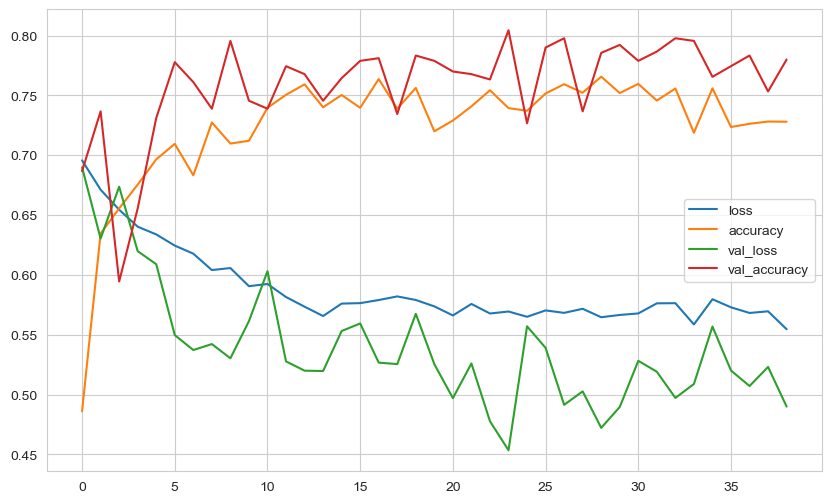

In [205]:
loss_df.plot()
plt.show()

In [206]:
# Predict on the test set
y_pred = (model_last.predict(X_test) > 0.5).astype("int32")

# Print confusion matrix
print(confusion_matrix(y_test, y_pred))

# Print classification report
print(classification_report(y_test, y_pred))

32/32 [==============================] - 0s 955us/step
[[667 129]
 [ 67 137]]
              precision    recall  f1-score   support

           0       0.91      0.84      0.87       796
           1       0.52      0.67      0.58       204

    accuracy                           0.80      1000
   macro avg       0.71      0.75      0.73      1000
weighted avg       0.83      0.80      0.81      1000



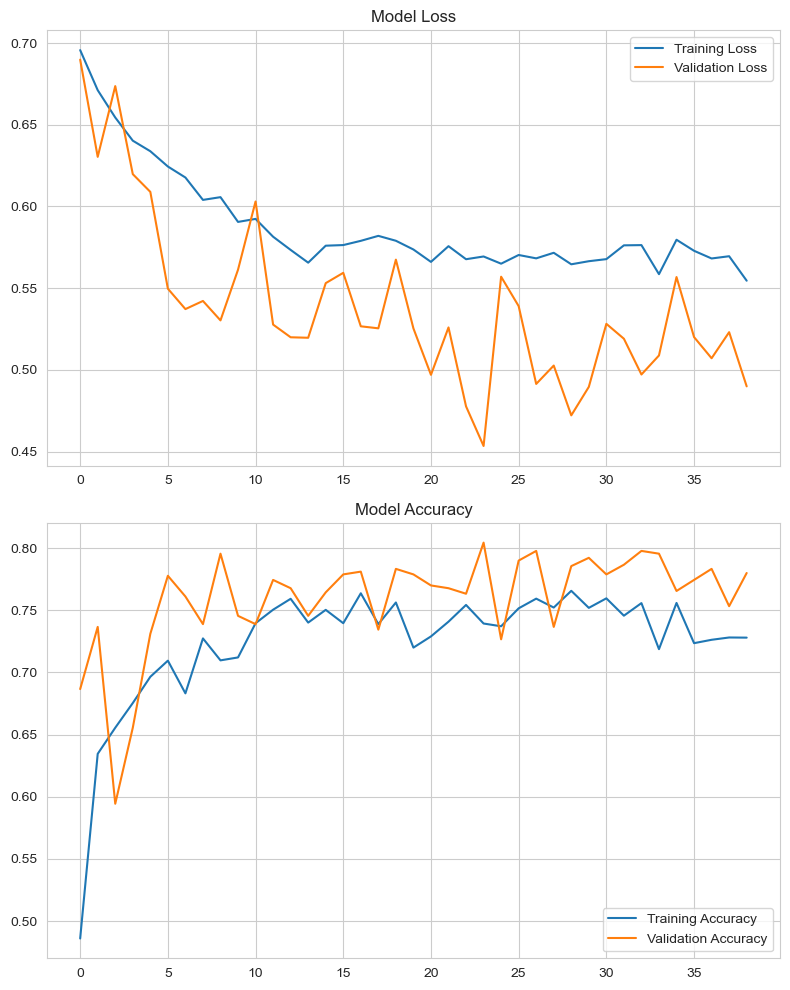

In [207]:
# Create subplots
fig, axes = plt.subplots(2, 1, figsize=(8, 10))

# Plot loss
axes[0].plot(loss_df["loss"], label="Training Loss")
axes[0].plot(loss_df["val_loss"], label="Validation Loss")
axes[0].set_title("Model Loss")
axes[0].legend()

# Plot accuracy
axes[1].plot(loss_df["accuracy"], label="Training Accuracy")
axes[1].plot(loss_df["val_accuracy"], label="Validation Accuracy")
axes[1].set_title("Model Accuracy")
axes[1].legend()

# Show the plots
plt.tight_layout()
plt.show()

In [208]:
import pickle
from keras.models import load_model
pickle.dump(scaler, open("scaler_churn", "wb"))

In [209]:
model_last.save("model_churn.h5")

In [210]:
model_churn = load_model("model_churn.h5")


In [211]:
scaler_churn = pickle.load(open("scaler_churn", "rb"))

## Prediction

In [212]:
single_customer = df.drop("churn", axis=1).iloc[0:5, :]
single_customer

,creditscore,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,geography_Germany,geography_Spain,gender_Male
0,619,42,2,0.00,1,1,1,"101,348.88",0,0,0
1,608,41,1,"83,807.86",1,0,1,"112,542.58",0,1,0
2,502,42,8,"159,660.80",3,1,0,"113,931.57",0,0,0
3,699,39,1,0.00,2,0,0,"93,826.63",0,0,0
4,850,43,2,"125,510.82",1,1,1,"79,084.10",0,1,0


In [213]:
single_customer.to_csv('single_customer.csv', index=False)

In [214]:
single_customer = scaler_churn.transform(single_customer)
single_customer

array([[0.538     , 0.32432432, 0.2       , 0.        , 0.        ,
        1.        , 1.        , 0.50654122, 0.        , 0.        ,
        0.        ],
       [0.516     , 0.31081081, 0.1       , 0.35156138, 0.        ,
        0.        , 1.        , 0.56253704, 0.        , 1.        ,
        0.        ],
       [0.304     , 0.32432432, 0.8       , 0.66975307, 0.66666667,
        1.        , 0.        , 0.56948538, 0.        , 0.        ,
        0.        ],
       [0.698     , 0.28378378, 0.1       , 0.        , 0.33333333,
        0.        , 0.        , 0.46891161, 0.        , 0.        ,
        0.        ],
       [1.        , 0.33783784, 0.2       , 0.52649903, 0.        ,
        1.        , 1.        , 0.39516297, 0.        , 1.        ,
        0.        ]])

In [215]:
(model_churn.predict(single_customer) > 0.5).astype("int32")

1/1 [==============================] - 0s 51ms/step


array([[0],
       [0],
       [1],
       [0],
       [0]])

In [216]:
df["churn"].iloc[0:5]

0    1
1    0
2    1
3    0
4    0
Name: churn, dtype: int64

## Comparison with ML

In [217]:
from sklearn.linear_model import LogisticRegression

In [218]:
log_model = LogisticRegression(class_weight="balanced", max_iter=1000)
log_model.fit(X_train, y_train)
y_pred = log_model.predict(X_test)
y_pred_train = log_model.predict(X_train)
print("Test", end="\n-*-*-*-*-*-*-*-*-*-\n")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
print("Train", end="\n-*-*-*-*-*-*-*-*-*-\n")
print(confusion_matrix(y_train, y_pred_train))
print(classification_report(y_train, y_pred_train))

Test
-*-*-*-*-*-*-*-*-*-
[[560 236]
 [ 67 137]]
              precision    recall  f1-score   support

           0       0.89      0.70      0.79       796
           1       0.37      0.67      0.47       204

    accuracy                           0.70      1000
   macro avg       0.63      0.69      0.63      1000
weighted avg       0.79      0.70      0.72      1000

Train
-*-*-*-*-*-*-*-*-*-
[[4632 1818]
 [ 503 1147]]
              precision    recall  f1-score   support

           0       0.90      0.72      0.80      6450
           1       0.39      0.70      0.50      1650

    accuracy                           0.71      8100
   macro avg       0.64      0.71      0.65      8100
weighted avg       0.80      0.71      0.74      8100



In [219]:
from sklearn.ensemble import RandomForestClassifier

In [220]:
rf_model = RandomForestClassifier(class_weight="balanced")
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
y_pred_train = rf_model.predict(X_train)
print("Test", end="\n-*-*-*-*-*-*-*-*-*-\n")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
print("Train", end="\n-*-*-*-*-*-*-*-*-*-\n")
print(confusion_matrix(y_train, y_pred_train))
print(classification_report(y_train, y_pred_train))

Test
-*-*-*-*-*-*-*-*-*-
[[760  36]
 [119  85]]
              precision    recall  f1-score   support

           0       0.86      0.95      0.91       796
           1       0.70      0.42      0.52       204

    accuracy                           0.84      1000
   macro avg       0.78      0.69      0.72      1000
weighted avg       0.83      0.84      0.83      1000

Train
-*-*-*-*-*-*-*-*-*-
[[6450    0]
 [   0 1650]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6450
           1       1.00      1.00      1.00      1650

    accuracy                           1.00      8100
   macro avg       1.00      1.00      1.00      8100
weighted avg       1.00      1.00      1.00      8100



___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___